In [1]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import seaborn as sns

# Problem Statement Definition

### Create a Predictive model for Loan Status



**Target Variable** : Loan_Status                                               
**Predictors** : Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,  Credit_History,Property_Area,Loan_Status

## Define the Type of Machine Learning Problem

Based on the problem statement you can understand that we need to create a **Supervised ML classification** model, as the target variable is categorical.

#  **1. Data Collection**

In [2]:
#from google.colab import files
testpath = 'test.csv'
trainpath = 'train.csv'
test_df = pd.read_csv(testpath)
train_df = pd.read_csv(trainpath)

## 1.1  Basic Understanding of Data

This step is performed to guage the overall data. The volume of data, the types of columns present in the data. Initial assessment of the data should be done to identify which columns are Quantitative, Categorical or Qualitative.

This step helps to start the column rejection process. You must look at each column carefully and ask, does this column affect the values of the Target variable? For example in this case study, you will ask, does this column affect the loan status? If the answer is a clear "No", then remove the column immediately from the data, otherwise keep the column for further analysis.

There are some of the below commands which are used for Basic data exploration in Python

     head(),tail() : This helps to see a few sample rows of the data
     shape : This helps us to identify how many rows and columns present in dataset
     info(),dtypes : This provides the summarized information of the data
     describe() : This provides the descriptive statistical details of the data
     nunique(): This helps us to identify if a column is categorical or continuous
     isnull(): This helps us to identify how many are null values in a column
     duplicated() : This helps us to identify if we have any duplicate rows present in data set.

In [3]:
test_df.head()

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area
0,LP001015,Male,Yes,0,Graduate,No,5720,0,110.0,360.0,1.0,Urban
1,LP001022,Male,Yes,1,Graduate,No,3076,1500,126.0,360.0,1.0,Urban
2,LP001031,Male,Yes,2,Graduate,No,5000,1800,208.0,360.0,1.0,Urban
3,LP001035,Male,Yes,2,Graduate,No,2340,2546,100.0,360.0,NaN,Urban
4,LP001051,Male,No,0,Not Graduate,No,3276,0,78.0,360.0,1.0,Urban


In [4]:
train_df.head()

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
0,LP001002,Male,No,0,Graduate,No,5849,0.0,NaN,360.0,1.0,Urban,Y
1,LP001003,Male,Yes,1,Graduate,No,4583,1508.0,128.0,360.0,1.0,Rural,N
2,LP001005,Male,Yes,0,Graduate,Yes,3000,0.0,66.0,360.0,1.0,Urban,Y
3,LP001006,Male,Yes,0,Not Graduate,No,2583,2358.0,120.0,360.0,1.0,Urban,Y
4,LP001008,Male,No,0,Graduate,No,6000,0.0,141.0,360.0,1.0,Urban,Y


In [5]:
test_df.columns

Index(['Loan_ID', 'Gender', 'Married', 'Dependents', 'Education',
       'Self_Employed', 'ApplicantIncome', 'CoapplicantIncome', 'LoanAmount',
       'Loan_Amount_Term', 'Credit_History', 'Property_Area'],
      dtype='object')

In [6]:
train_df.columns

Index(['Loan_ID', 'Gender', 'Married', 'Dependents', 'Education',
       'Self_Employed', 'ApplicantIncome', 'CoapplicantIncome', 'LoanAmount',
       'Loan_Amount_Term', 'Credit_History', 'Property_Area', 'Loan_Status'],
      dtype='object')

In [7]:
train_df.shape,test_df.shape

((614, 13), (367, 12))

In [8]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Loan_ID            614 non-null    object 
 1   Gender             601 non-null    object 
 2   Married            611 non-null    object 
 3   Dependents         599 non-null    object 
 4   Education          614 non-null    object 
 5   Self_Employed      582 non-null    object 
 6   ApplicantIncome    614 non-null    int64  
 7   CoapplicantIncome  614 non-null    float64
 8   LoanAmount         592 non-null    float64
 9   Loan_Amount_Term   600 non-null    float64
 10  Credit_History     564 non-null    float64
 11  Property_Area      614 non-null    object 
 12  Loan_Status        614 non-null    object 
dtypes: float64(4), int64(1), object(8)
memory usage: 62.5+ KB


In [9]:
train_df.nunique()

Loan_ID              614
Gender                 2
Married                2
Dependents             4
Education              2
Self_Employed          2
ApplicantIncome      505
CoapplicantIncome    287
LoanAmount           203
Loan_Amount_Term      10
Credit_History         2
Property_Area          3
Loan_Status            2
dtype: int64

In [10]:
train_info = train_df.describe(include='all').transpose()
test_info = test_df.describe(include='all').transpose()

In [11]:
train_info['DataType']=train_df.dtypes
train_info['NullCount'] = train_df.isnull().sum()
test_info['DataType']=test_df.dtypes
test_info['NullCount'] = test_df.isnull().sum()

In [12]:
train_df.isnull().sum()

Loan_ID               0
Gender               13
Married               3
Dependents           15
Education             0
Self_Employed        32
ApplicantIncome       0
CoapplicantIncome     0
LoanAmount           22
Loan_Amount_Term     14
Credit_History       50
Property_Area         0
Loan_Status           0
dtype: int64

In [13]:
test_info

,count,unique,top,freq,mean,std,min,25%,50%,75%,max,DataType,NullCount
Loan_ID,367,367,LP002294,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,object,0
Gender,356,2,Male,286,NaN,NaN,NaN,NaN,NaN,NaN,NaN,object,11
Married,367,2,Yes,233,NaN,NaN,NaN,NaN,NaN,NaN,NaN,object,0
Dependents,357,4,0,200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,object,10
Education,367,2,Graduate,283,NaN,NaN,NaN,NaN,NaN,NaN,NaN,object,0
Self_Employed,344,2,No,307,NaN,NaN,NaN,NaN,NaN,NaN,NaN,object,23
ApplicantIncome,367,NaN,NaN,NaN,4805.6,4910.69,0,2864,3786,5060,72529,int64,0
CoapplicantIncome,367,NaN,NaN,NaN,1569.58,2334.23,0,0,1025,2430.5,24000,int64,0
LoanAmount,362,NaN,NaN,NaN,136.133,61.3667,28,100.25,125,158,550,float64,5
Loan_Amount_Term,361,NaN,NaN,NaN,342.537,65.1566,6,360,360,360,480,float64,6


In [14]:
train_info

,count,unique,top,freq,mean,std,min,25%,50%,75%,max,DataType,NullCount
Loan_ID,614,614,LP002229,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,object,0
Gender,601,2,Male,489,NaN,NaN,NaN,NaN,NaN,NaN,NaN,object,13
Married,611,2,Yes,398,NaN,NaN,NaN,NaN,NaN,NaN,NaN,object,3
Dependents,599,4,0,345,NaN,NaN,NaN,NaN,NaN,NaN,NaN,object,15
Education,614,2,Graduate,480,NaN,NaN,NaN,NaN,NaN,NaN,NaN,object,0
Self_Employed,582,2,No,500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,object,32
ApplicantIncome,614,NaN,NaN,NaN,5403.46,6109.04,150,2877.5,3812.5,5795,81000,int64,0
CoapplicantIncome,614,NaN,NaN,NaN,1621.25,2926.25,0,0,1188.5,2297.25,41667,float64,0
LoanAmount,592,NaN,NaN,NaN,146.412,85.5873,9,100,128,168,700,float64,22
Loan_Amount_Term,600,NaN,NaN,NaN,342,65.1204,12,360,360,360,480,float64,14


In [15]:
train_df.duplicated().sum()

0

In [16]:
test_df.duplicated().sum()

0

#### **Result of Basic Exploration of Data**
#### Based on the basic exploration above, you can now create a simple report of the data, noting down your observations regarding each column. Hence, creating a initial roadmap for further analysis.

The selected columns in this are considered for further study and then a final list will be created

1.   Gender -->  Nomianl Categorical Variable
2.   Married --> Boolean Categorical Variable
3.   Dependents --> Ordinal Categorical Variable
4.   Education -->  Nominal Categorical Variable
5.   Self_Employed --> Nominal Categorical Variable
6.	 ApplicantIncome --> Continuous Variable 
7.	CoapplicantIncome --> Continuous Variable
8.	LoanAmount --> Continuous Variable
9.	Loan_Amount_Term --> Continuous Variable 
10. Credit_History --> Categorical Boolean Variable 
11. Property_Area --> Categorical Nominal Variable

## 1.2 Univariate Analysis

##### Categorical variables: Bar plot
##### Continuous variables: Histogram, Density & Boxplots

In [17]:
CategoricalColsList=[ 'Gender', 'Married', 'Dependents', 'Education', 'Self_Employed', 'Credit_History', 'Property_Area','Loan_Amount_Term','Loan_Status']
ContinuousColsList = ['ApplicantIncome','CoapplicantIncome','LoanAmount']

### 1.2.1 For Categorical variables

We can spot a categorical variable in the data by looking at the unique values in them. Typically a categorical variable contains less than 20 Unique values AND there is repetition of values, which means the data can be grouped by those unique values.

Based on the Basic Data Exploration above, we have spotted 7 categorical predictors and 1 target variable in the data

   ##### **Categorical Predictors:** 'Gender', 'Married', 'Dependents', 'Education', 'Self_Employed', 'Credit_History', 'Property_Area',Loan_Amount_Term
   ##### **Target Variable** 'Loan_Status'

We use bar charts to see how the data is distributed for these categorical columns.

In [18]:
def PlotBarCharts(inpData, colsToPlot):
    %matplotlib inline   
    import matplotlib.pyplot as plt   
    # Generating multiple subplots
    fig, subPlot=plt.subplots(nrows=1, ncols=len(colsToPlot), figsize=(40,6))
    fig.suptitle('Bar charts of: '+ str(colsToPlot))
    for colName, plotNumber in zip(colsToPlot, range(len(colsToPlot))):
        inpData.groupby(colName).size().plot(kind='bar',ax=subPlot[plotNumber])

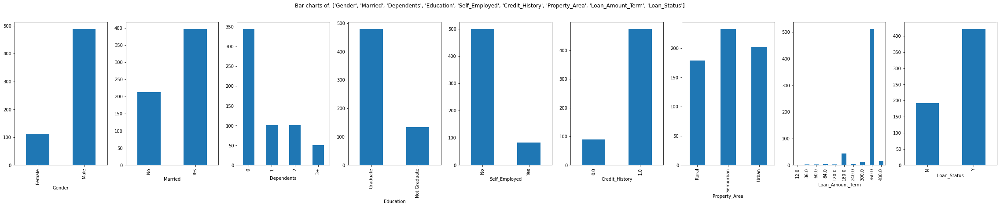

In [19]:
PlotBarCharts(inpData=train_df, colsToPlot=CategoricalColsList)

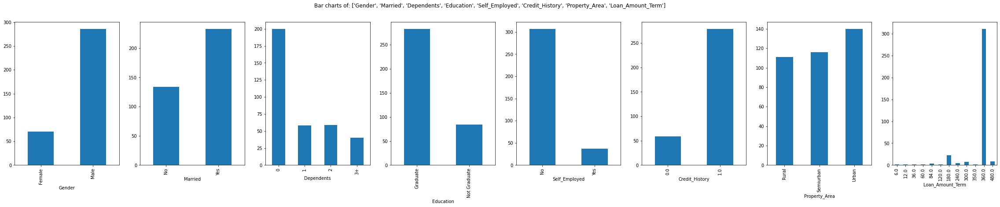

In [20]:
PlotBarCharts(inpData=test_df, colsToPlot=[ 'Gender', 'Married', 'Dependents', 'Education', 'Self_Employed', 'Credit_History', 'Property_Area','Loan_Amount_Term'])

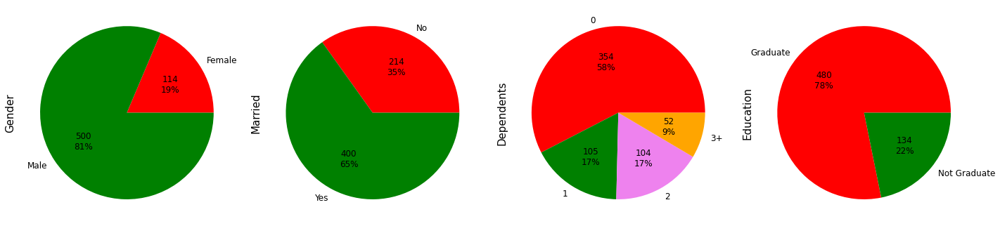

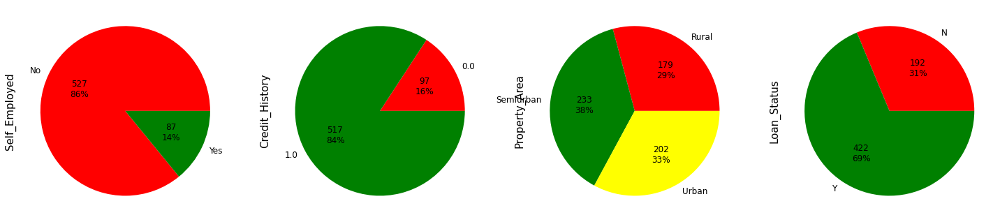

In [21]:
def label_function(val):
    return f'{val / 100 * len(train_df):.0f}\n{val:.0f}%'
N = 50

fig, (ax1, ax2, ax3, ax4) = plt.subplots(ncols=4, figsize=(20, 10))
train_df.groupby('Gender').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['red', 'green'], ax=ax1)
train_df.groupby('Married').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['red', 'green'], ax=ax2)
train_df.groupby('Dependents').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['red', 'green', 'violet', 'orange'], ax=ax3)
train_df.groupby('Education').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['red', 'green'], ax=ax4)
ax1.set_ylabel('Gender', size=15)
ax2.set_ylabel('Married', size=15)
ax3.set_ylabel('Dependents', size=15)
ax4.set_ylabel('Education', size=15)
plt.tight_layout()
fig, (ax1, ax2, ax3,ax4) = plt.subplots(ncols=4, figsize=(20, 10))
train_df.groupby('Self_Employed').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['red', 'green'], ax=ax1)
train_df.groupby('Credit_History').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['red', 'green'], ax=ax2)
train_df.groupby('Property_Area').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['red', 'green', 'yellow'], ax=ax3)
train_df.groupby('Loan_Status').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['red', 'green'], ax=ax4)
ax1.set_ylabel('Self_Employed', size=15)
ax2.set_ylabel('Credit_History', size=15)
ax3.set_ylabel('Property_Area', size=15)
ax4.set_ylabel('Loan_Status', size=15)
plt.tight_layout()
plt.show()


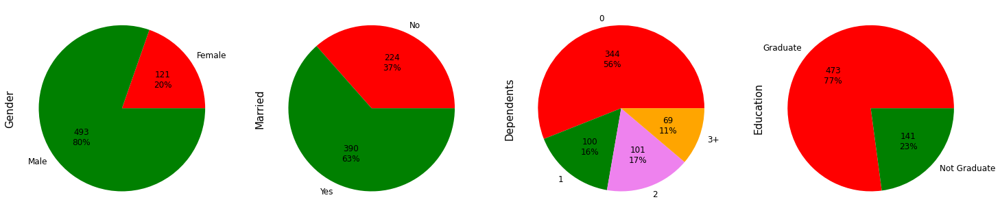

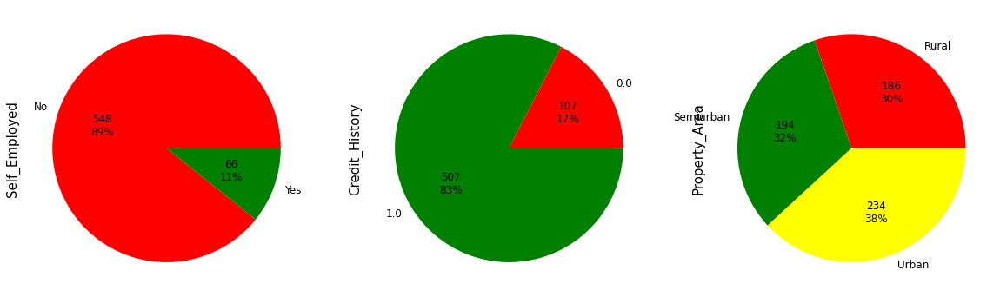

In [22]:
N = 50
fig, (ax1, ax2, ax3, ax4) = plt.subplots(ncols=4, figsize=(25, 10))
test_df.groupby('Gender').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['red', 'green'], ax=ax1)
test_df.groupby('Married').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['red', 'green'], ax=ax2)
test_df.groupby('Dependents').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['red', 'green', 'violet', 'orange'], ax=ax3)
test_df.groupby('Education').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['red', 'green'], ax=ax4)
ax1.set_ylabel('Gender', size=15)
ax2.set_ylabel('Married', size=15)
ax3.set_ylabel('Dependents', size=15)
ax4.set_ylabel('Education', size=15)
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(20, 8))
test_df.groupby('Self_Employed').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['red', 'green'], ax=ax1)
test_df.groupby('Credit_History').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['red', 'green'], ax=ax2)
test_df.groupby('Property_Area').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['red', 'green', 'yellow'], ax=ax3)
ax1.set_ylabel('Self_Employed', size=15)
ax2.set_ylabel('Credit_History', size=15)
ax3.set_ylabel('Property_Area', size=15)
plt.show()


### 1.2.2 For Continuous Variables

**Continuous Variable Predictors** - 'ApplicantIncome','CoapplicantIncome','LoanAmount'

In [23]:
def PlotContinousCharts(inpData, colsToPlot):
    %matplotlib inline   
    plt.figure(figsize=(30, 50))
    for i, col in enumerate(colsToPlot):
      plt.subplot(9, 3, i*3+1)
      plt.subplots_adjust(hspace =.25, wspace=.1)   
      plt.grid(True)
      plt.title('HistPlot : '+col)
      sns.histplot(inpData[col], label=col, color = "blue")
      plt.subplot(9, 3, i*3+2) 
      plt.title('BoxPlot : '+col)
      sns.boxplot(inpData[col])
      plt.subplot(9, 3, i*3+3) 
      plt.title('KDEPlot : '+col)
      sns.kdeplot(inpData[col],shade=True)

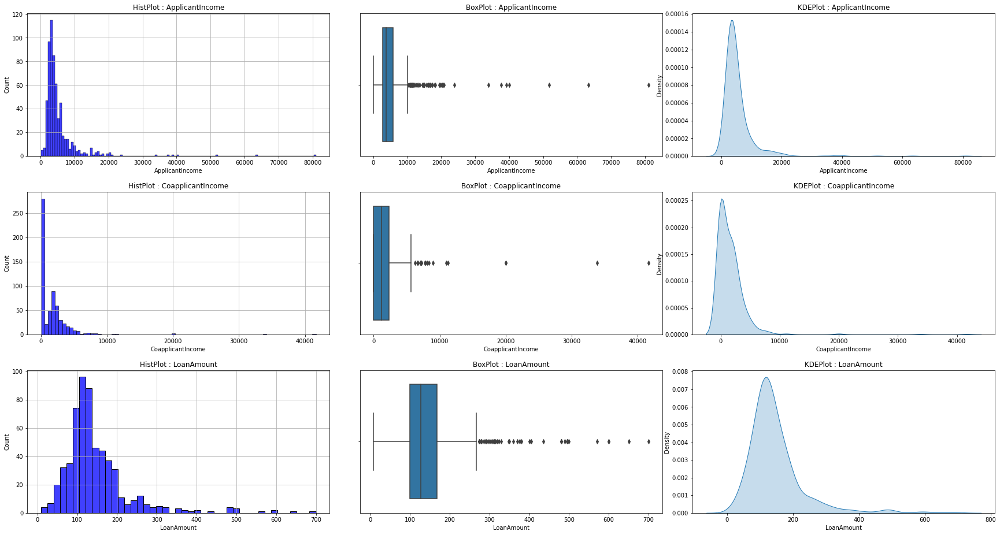

In [24]:
PlotContinousCharts(inpData=train_df, colsToPlot=ContinuousColsList)

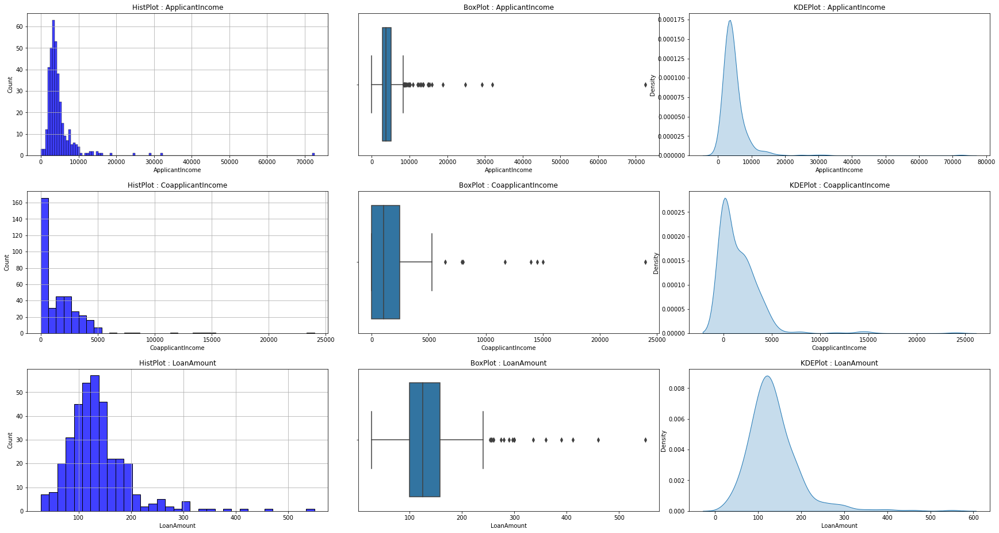

In [25]:
PlotContinousCharts(inpData=test_df, colsToPlot=ContinuousColsList)

## 1.3 Bivariate Analysis 

### 1.3.1 For Categorical Variables with Target Variable

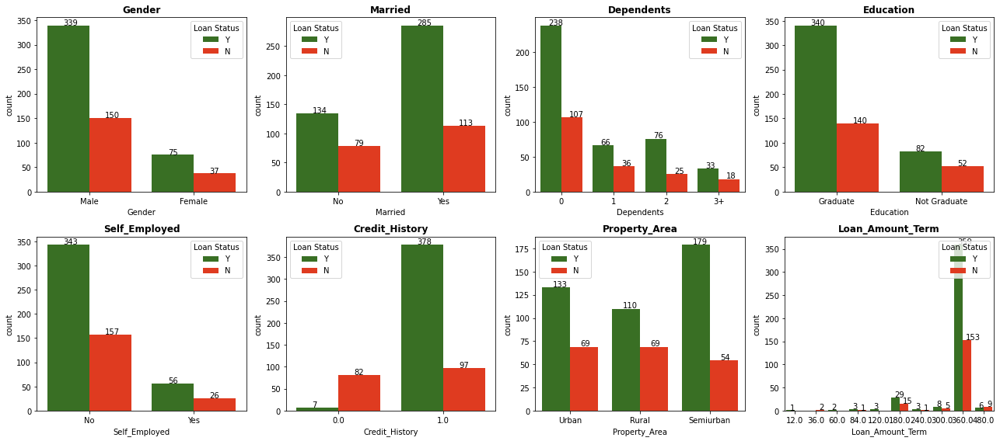

In [26]:
cols = ['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed', 'Credit_History', 'Property_Area','Loan_Amount_Term']
nr_rows = 2
nr_cols = 4
fig, axs = plt.subplots(nr_rows, nr_cols, figsize=(nr_cols*4.5,nr_rows*4))
for r in range(0,nr_rows):
    for c in range(0,nr_cols):          
        i = r*nr_cols+c       
        ax = axs[r][c]
        sns.countplot(train_df[cols[i]], hue=train_df["Loan_Status"], ax=ax,palette=['#347C17',"#FF2400"])
        ax.set_title(cols[i], fontsize=12, fontweight='bold')
        ax.legend(title="Loan Status", loc='best')    
        for p in ax.patches:
            ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.15, p.get_height()+1))        
plt.tight_layout()     

#### Pie Chart

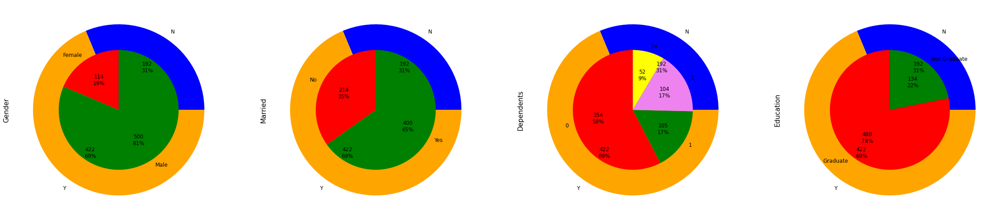

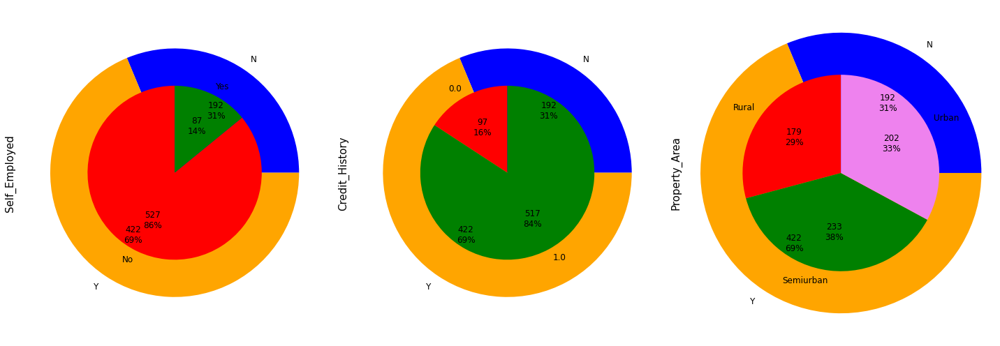

In [27]:
fig, (ax1, ax2,ax3,ax4) = plt.subplots(ncols=4, figsize=(40, 15))
train_df.groupby('Loan_Status').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['blue', 'orange'],ax=ax1)
train_df.groupby('Gender').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['red', 'green'], radius=0.7,startangle=90,ax=ax1)
ax1.set_ylabel('Gender', size=15)
train_df.groupby('Loan_Status').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['blue', 'orange'],ax=ax2)
train_df.groupby('Married').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['red', 'green'], radius=0.7,startangle=90,ax=ax2)
ax2.set_ylabel('Married', size=15)
train_df.groupby('Loan_Status').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['blue', 'orange'],ax=ax3)
train_df.groupby('Dependents').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['red', 'green', 'violet', 'yellow'], radius=0.7,startangle=90,ax=ax3)
ax3.set_ylabel('Dependents', size=15)
train_df.groupby('Loan_Status').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['blue', 'orange'],ax=ax4)
train_df.groupby('Education').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['red', 'green'], radius=0.7,startangle=90,ax=ax4)
ax4.set_ylabel('Education', size=15)

fig, (ax1, ax2,ax3) = plt.subplots(ncols=3, figsize=(20, 7))
train_df.groupby('Loan_Status').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['blue', 'orange'],ax=ax1)
train_df.groupby('Self_Employed').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['red', 'green'], radius=0.7,startangle=90,ax=ax1)
ax1.set_ylabel('Self_Employed', size=15)
train_df.groupby('Loan_Status').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['blue', 'orange'],ax=ax2)
train_df.groupby('Credit_History').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['red', 'green'], radius=0.7,startangle=90,ax=ax2)
ax2.set_ylabel('Credit_History', size=15)
train_df.groupby('Loan_Status').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['blue', 'orange'],ax=ax3)
train_df.groupby('Property_Area').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12},colors=['red', 'green', 'violet', 'yellow'], radius=0.7,startangle=90,ax=ax3)
ax3.set_ylabel('Property_Area', size=15)

plt.axis('equal')
plt.tight_layout()
plt.show()

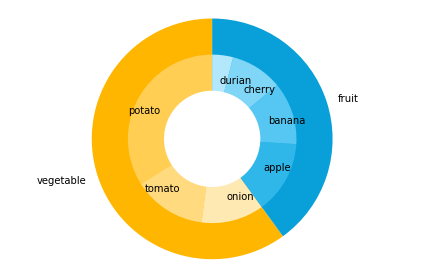

In [28]:
labels = ['vegetable', 'fruit']
sizes = [300, 200]
labels_vegefruit = ['potato', 'tomato', 'onion', 'apple',
                    'banana', 'cherry', 'durian']
sizes_vegefruit = [170, 70, 60, 70, 60, 50, 20]
colors = ['#FFB600', '#09A0DA']
colors_vegefruit = ['#FFCE53', '#FFDA7E', '#FFE9B2', '#30B7EA',
                    '#56C7F2','#7FD6F7', '#B3E7FB']
 
bigger = plt.pie(sizes, labels=labels, colors=colors,
                 startangle=90, frame=True)
smaller = plt.pie(sizes_vegefruit, labels=labels_vegefruit,
                  colors=colors_vegefruit, radius=0.7,
                  startangle=90, labeldistance=0.7)
centre_circle = plt.Circle((0, 0), 0.4, color='white', linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
        
plt.axis('equal')
plt.tight_layout()

plt.show()

### 1.3.2 For Continuous Variable with Target Variable

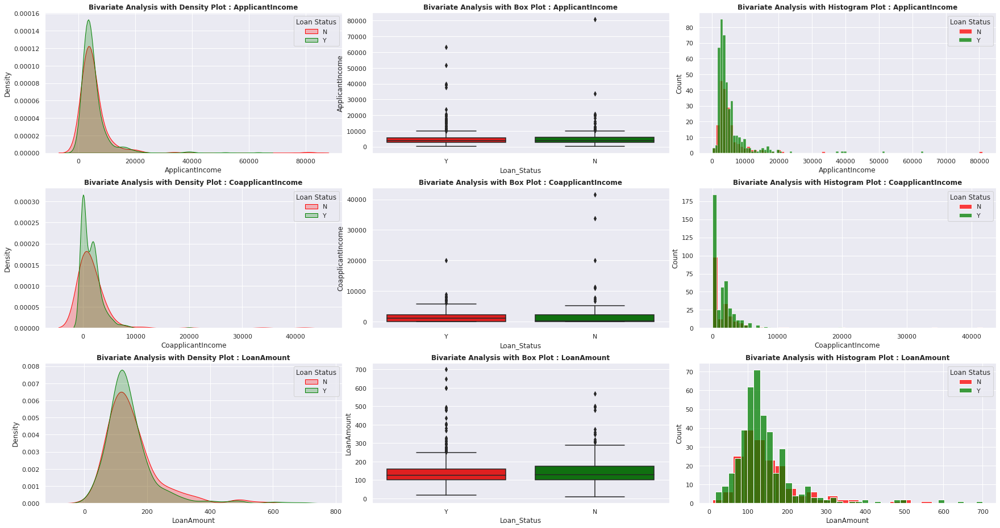

In [29]:
sns.set(font_scale=1)
continous_var = ContinuousColsList
plt.figure(figsize=(30, 50))
for i, col in enumerate(continous_var):
    plt.subplot(9, 3, i*3+1)
    plt.subplots_adjust(hspace =.25, wspace=.1)
    plt.grid(True)
    plt.title('Bivariate Analysis with Density Plot : '+col,fontsize=12, fontweight='bold')
    ax=sns.kdeplot(train_df.loc[train_df["Loan_Status"]=='N', col], label="N", color = "red", fill=True)
    ax=sns.kdeplot(train_df.loc[train_df["Loan_Status"]=='Y', col], label="Y",  color = "green", fill=True)
    ax.legend(title="Loan Status", loc='best') 
    plt.subplot(9, 3, i*3+2) 
    ax1=sns.boxplot(y = col, data = train_df, x="Loan_Status", palette = ["red", "green"])
    plt.title('Bivariate Analysis with Box Plot : '+col,fontsize=12, fontweight='bold')
    plt.subplot(9, 3, i*3+3) 
    ax2=sns.histplot(train_df.loc[train_df["Loan_Status"]=='N', col], label="N", color = "red")
    ax2=sns.histplot(train_df.loc[train_df["Loan_Status"]=='Y', col], label="Y",  color = "green")
    ax2.legend(title="Loan Status", loc='best') 
    plt.title('Bivariate Analysis with Histogram Plot : '+col,fontsize=12, fontweight='bold')

## 1.4 Multivariate Analysis

### 1.4.1 Pair Plot

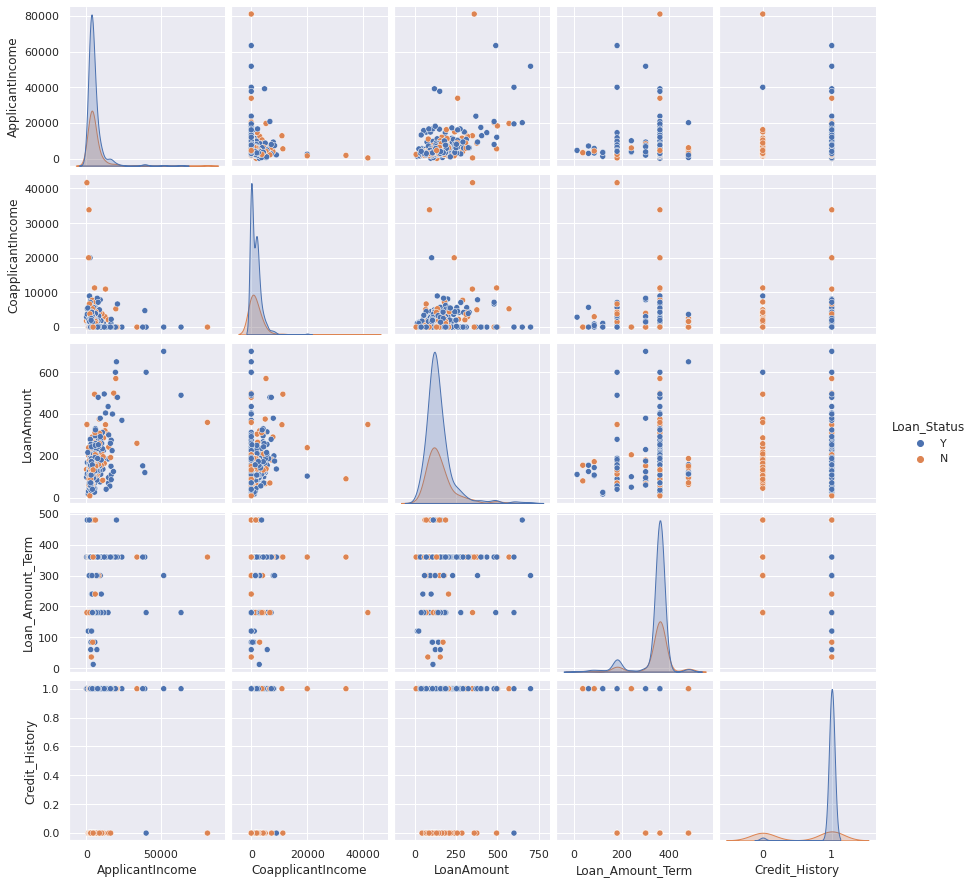

In [30]:
sns.pairplot(train_df,hue='Loan_Status')

### 1.4.2 Clustermap

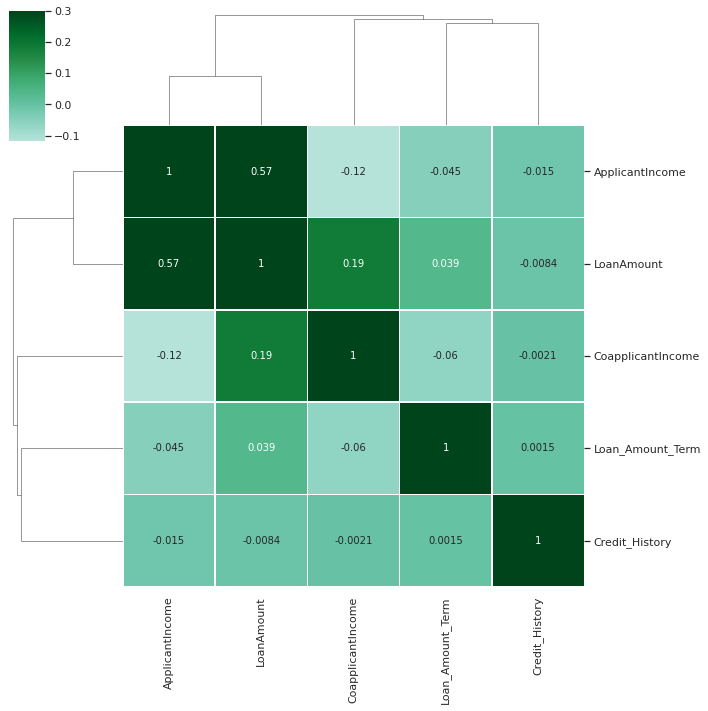

In [31]:
corr = train_df.corr()
sns.set(font_scale=1)
sns.clustermap(corr, cmap='BuGn', vmax=.3, center=0,square=False, linewidths=.5,annot=True, cbar_kws={"shrink": .5},annot_kws={"size": 10})

# **2. Data Preparation**

## 2.1 Handling Missing values

### 2.1.1 Plotting Missing Values

In [32]:
train_imp = train_df
train_imp.drop('Loan_ID',  axis='columns', inplace=True)

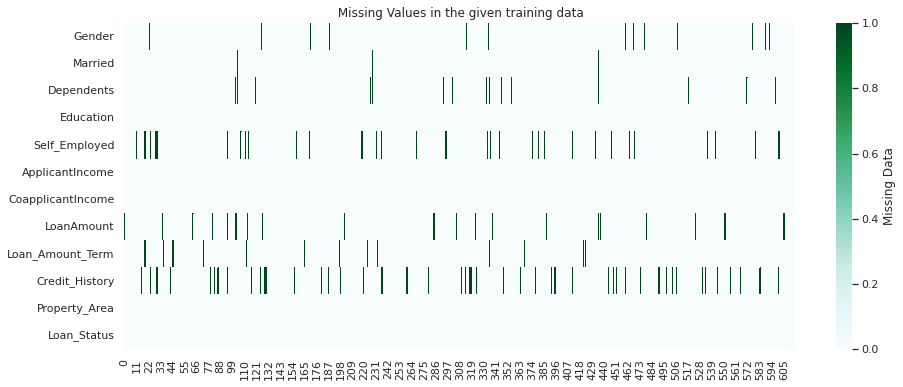

In [33]:
plt.figure(figsize=(15,6))
sns.heatmap(train_imp.isna().transpose(),cmap="BuGn",cbar_kws={'label': 'Missing Data'})
plt.title(" Missing Values in the given training data")
sns.set(font_scale=1)

In [34]:
cat_null =[ 'Gender', 'Married', 'Dependents',  'Self_Employed', 'Credit_History', 'Loan_Amount_Term']
con_null = ['ApplicantIncome','CoapplicantIncome','LoanAmount']

### 2.1.2 For Continuous Data

In [35]:
from sklearn.experimental import enable_iterative_imputer  
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor
# Run the imputer with a simple Random Forest estimator
imp = IterativeImputer(RandomForestRegressor(n_estimators=5), max_iter=5, random_state=1)
to_train = con_null
#perform filling
train_imp[to_train] = pd.DataFrame(imp.fit_transform(train_imp[to_train]), columns=to_train)

### 2.1.3 For Categorical Data

In [36]:
# Imputer object using the mean strategy and 
# missing_values type for imputation
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import  RandomForestClassifier
train_imp[cat_null] = train_imp[cat_null].apply(lambda series: pd.Series(LabelEncoder().fit_transform(series[series.notnull()]),index=series[series.notnull()].index))
imp_cat = IterativeImputer(estimator=RandomForestClassifier(),initial_strategy='most_frequent',max_iter=10, random_state=0)
train_imp[cat_null] = imp_cat.fit_transform(train_imp[cat_null])

### 2.1.4 Result : Heat Map after Handling Missing Values

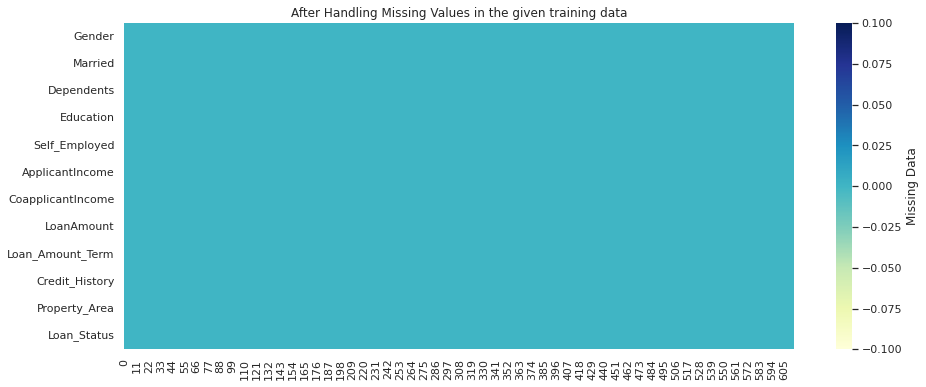

In [37]:
plt.figure(figsize=(15,6))
sns.heatmap(train_imp.isna().transpose(),cmap="YlGnBu",cbar_kws={'label': 'Missing Data'})
plt.title("After Handling Missing Values in the given training data")
sns.set(font_scale=1)

## 2.2 Handling Outliers

#### 2.2.1 For Continuous Variables

Outliers are extreme values in the data which are far away from most of the values. You can see them as the tails in the histogram.

Outlier must be treated one column at a time. As the treatment will be slightly different for each column.Outliers bias the training of machine learning models. As the algorithm tries to fit the extreme value, it goes away from majority of the data.

There are below two options to treat outliers in the data.

    Option-1: Delete the outlier Records. Only if there are just few rows lost.
    Option-2: Impute the outlier values with a logical business value                                         
Below we are finding out the **Inter Quartile Range Method** outliers by looking at the histogram.

In [38]:
for x in ['ApplicantIncome','CoapplicantIncome','LoanAmount']:
    q75,q25 = np.percentile(train_imp.loc[:,x],[75,25])
    intr_qr = q75-q25
    max = q75+(1.5*intr_qr)
    min = q25-(1.5*intr_qr)
    train_imp.loc[train_imp[x] < min,x] = min
    train_imp.loc[train_imp[x] > max,x] = max

## 2.3 Categorical variable with Target Value after handling outliers and missing data

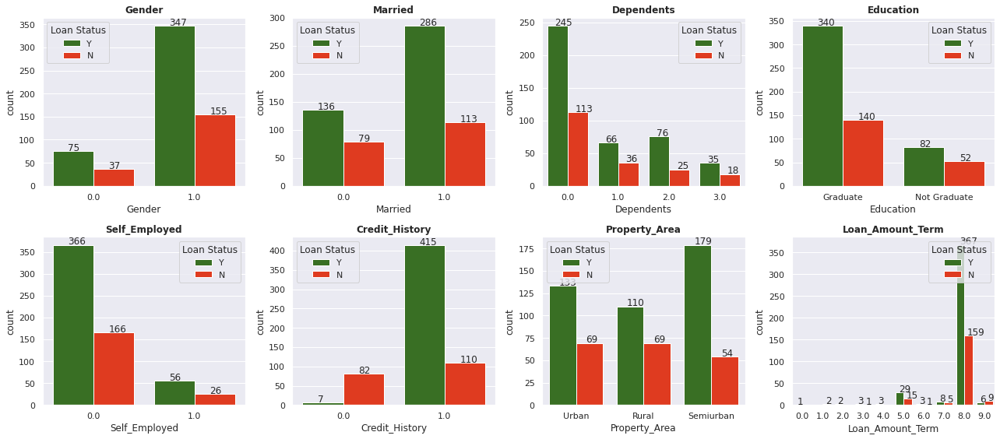

In [39]:
cols = ['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed', 'Credit_History', 'Property_Area','Loan_Amount_Term']
nr_rows = 2
nr_cols = 4
fig, axs = plt.subplots(nr_rows, nr_cols, figsize=(nr_cols*4.5,nr_rows*4))
for r in range(0,nr_rows):
    for c in range(0,nr_cols):          
        i = r*nr_cols+c       
        ax = axs[r][c]
        sns.countplot(train_imp[cols[i]], hue=train_imp["Loan_Status"], ax=ax,palette=['#347C17',"#FF2400"])
        ax.set_title(cols[i], fontsize=12, fontweight='bold')
        ax.legend(title="Loan Status", loc='best')    
        for p in ax.patches:
            ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.15, p.get_height()+1))        
plt.tight_layout()     

## 2.4 Continuous variable with Target Value after handling outliers and missing data

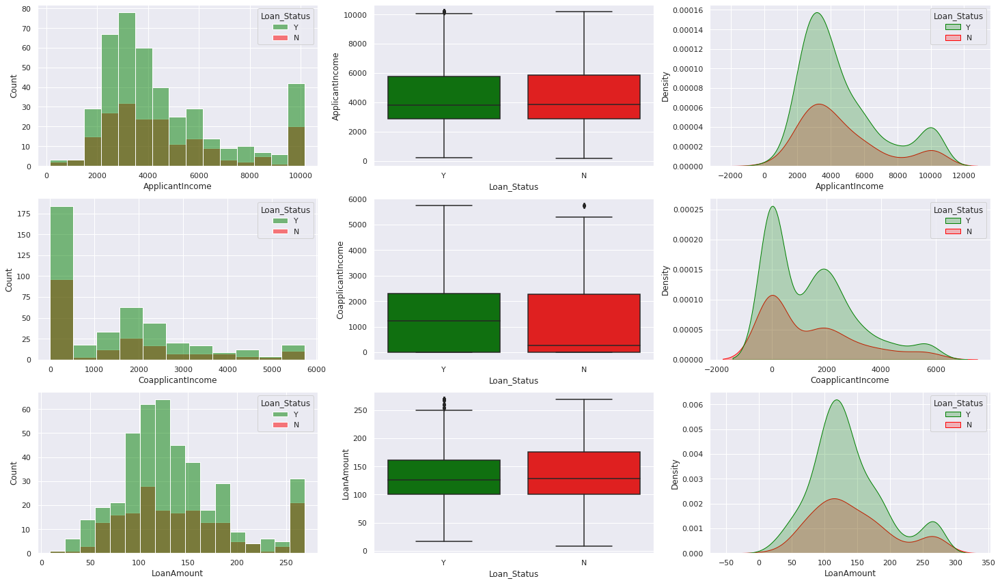

In [40]:
a = 4  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter
fig = plt.figure(figsize=(25,20))
for i in ContinuousColsList:
    plt.subplot(a, b, c)
    plt.xlabel(i)
    sns.histplot(x=train_imp[i],hue=train_imp['Loan_Status'],palette = ["green", "red"])
    c = c + 1
    plt.subplot(a, b, c)
    plt.xlabel(i)
    sns.boxplot(y = i, data = train_imp, x='Loan_Status', palette = ["green", "red"])
    c = c + 1
    plt.subplot(a, b, c)
    plt.xlabel(i)
    sns.kdeplot(data = train_imp, x = i, hue = 'Loan_Status',fill=True,palette = ["green", "red"])
    c = c + 1
plt.show()

## 2.5 Encoding

### 2.5.1 Encoding Categorical Variables

From the above plots, it is proved that we have removed outliers by using IQR method.

List of steps performed on predictor variables before data can be used for machine learning
1.   Converting each Ordinal Categorical columns to numeric
2.   Converting Binary nominal Categorical columns to numeric using 1/0 mapping
3.  Converting all other nominal categorical columns to numeric using pd.get_dummies()




In [41]:
train_imp.head()

,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
0,1.0,0.0,0.0,Graduate,0.0,5849.0,0.0,139.2,8.0,1.0,Urban,Y
1,1.0,1.0,1.0,Graduate,0.0,4583.0,1508.0,128.0,8.0,1.0,Rural,N
2,1.0,1.0,0.0,Graduate,1.0,3000.0,0.0,66.0,8.0,1.0,Urban,Y
3,1.0,1.0,0.0,Not Graduate,0.0,2583.0,2358.0,120.0,8.0,1.0,Urban,Y
4,1.0,0.0,0.0,Graduate,0.0,6000.0,0.0,141.0,8.0,1.0,Urban,Y


In [42]:
train_enc = train_imp
# Treating the binary nominal variables first
train_enc['Loan_Status'].replace({'Y':1, 'N':0}, inplace=True)
# Treating all the nominal variables at once using dummy variables
train_enc=pd.get_dummies(train_enc)
train_enc.head()

,Gender,Married,Dependents,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Loan_Status,Education_Graduate,Education_Not Graduate,Property_Area_Rural,Property_Area_Semiurban,Property_Area_Urban
0,1.0,0.0,0.0,0.0,5849.0,0.0,139.2,8.0,1.0,1,1,0,0,0,1
1,1.0,1.0,1.0,0.0,4583.0,1508.0,128.0,8.0,1.0,0,1,0,1,0,0
2,1.0,1.0,0.0,1.0,3000.0,0.0,66.0,8.0,1.0,1,1,0,0,0,1
3,1.0,1.0,0.0,0.0,2583.0,2358.0,120.0,8.0,1.0,1,0,1,0,0,1
4,1.0,0.0,0.0,0.0,6000.0,0.0,141.0,8.0,1.0,1,1,0,0,0,1


## 2.6 Feature Selection


#### Defining Variables

In [43]:
train_enc.columns

Index(['Gender', 'Married', 'Dependents', 'Self_Employed', 'ApplicantIncome',
       'CoapplicantIncome', 'LoanAmount', 'Loan_Amount_Term', 'Credit_History',
       'Loan_Status', 'Education_Graduate', 'Education_Not Graduate',
       'Property_Area_Rural', 'Property_Area_Semiurban',
       'Property_Area_Urban'],
      dtype='object')

In [44]:
inp_cat = ['Gender', 'Married', 'Dependents', 'Self_Employed', 'Loan_Amount_Term', 'Credit_History', 'Education_Graduate', 'Education_Not Graduate',
       'Property_Area_Rural', 'Property_Area_Semiurban','Property_Area_Urban']
inp_con = ['ApplicantIncome','CoapplicantIncome','LoanAmount']
out_cat = ['Loan_Status']


Now its time to finally choose the best columns(Features) which are correlated to the Target variable. This can be done directly by measuring the correlation values or ANOVA/Chi-Square tests.

However, we have visualized the relation between the Target variable and each of the predictors to get a better sense of data in Bivariate Analysis.

In machine learning and statistics, feature selection, also known as variable selection, attribute selection or variable subset selection, is the process of selecting a subset of relevant features (variables, predictors) for use in model construction. Feature selection techniques are used for several reasons:



> simplification of models to make them easier to interpret by researchers/users


> shorter training times


> enhanced generalization by reducing overfitting

In [45]:
train_enc.head()

,Gender,Married,Dependents,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Loan_Status,Education_Graduate,Education_Not Graduate,Property_Area_Rural,Property_Area_Semiurban,Property_Area_Urban
0,1.0,0.0,0.0,0.0,5849.0,0.0,139.2,8.0,1.0,1,1,0,0,0,1
1,1.0,1.0,1.0,0.0,4583.0,1508.0,128.0,8.0,1.0,0,1,0,1,0,0
2,1.0,1.0,0.0,1.0,3000.0,0.0,66.0,8.0,1.0,1,1,0,0,0,1
3,1.0,1.0,0.0,0.0,2583.0,2358.0,120.0,8.0,1.0,1,0,1,0,0,1
4,1.0,0.0,0.0,0.0,6000.0,0.0,141.0,8.0,1.0,1,1,0,0,0,1


In [46]:
train_features = train_enc
y = train_features['Loan_Status']
X = train_features.drop('Loan_Status',axis=1)

### Univariate Selection

**chi2, f_classif, mutual_info_classif**
The methods based on F-test estimate the degree of linear dependency between two random variables. On the other hand, mutual information methods can capture any kind of statistical dependency, but being nonparametric, they require more samples for accurate estimation.

#### **KBest with f_classif** 

We can select features according to the k highest scores. Along with ANOVA F-value Score between label/feature.

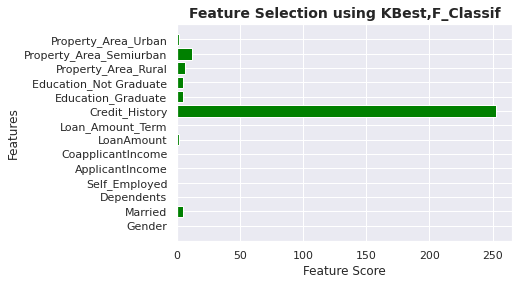

In [47]:
# ANOVA feature selection for numeric input and categorical output
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
bestfeatures = SelectKBest(score_func=f_classif, k=14)
fit = bestfeatures.fit(X, y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
df_fclassif = pd.concat([dfcolumns,dfscores],axis=1)
df_fclassif.columns = ['Features','fclass_Score']  ## naming the dataframe columns
#print(featureScores.nlargest(10,'Score'))  ## print 10 best features
plt.barh(df_fclassif['Features'],df_fclassif['fclass_Score'],color='green')
plt.ylabel('Features')
plt.xlabel('Feature Score')
plt.title('Feature Selection using KBest,F_Classif',fontsize=14, fontweight='bold')
plt.show()

#### **KBest with chi2** 

We can select features according to the k highest scores. Chi-squared stats of non-negative features.

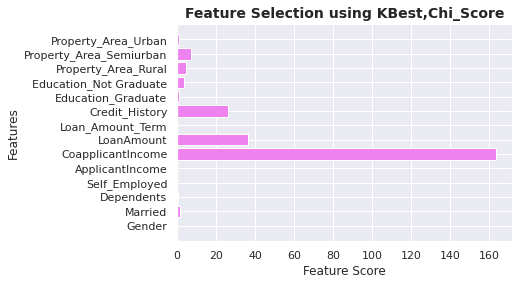

In [48]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
bestfeatures = SelectKBest(score_func=chi2, k=14)
fit = bestfeatures.fit(X, y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
df_chi = pd.concat([dfcolumns,dfscores],axis=1)
df_chi.columns = ['Features','chi_Score']  ## naming the dataframe columns
#print(featureScores.nlargest(10,'Score'))  ## print 10 best features
plt.barh(df_chi['Features'],df_chi['chi_Score'],color='violet')
plt.ylabel('Features')
plt.xlabel('Feature Score')
plt.title('Feature Selection using KBest,Chi_Score',fontsize=14, fontweight='bold')
plt.show()

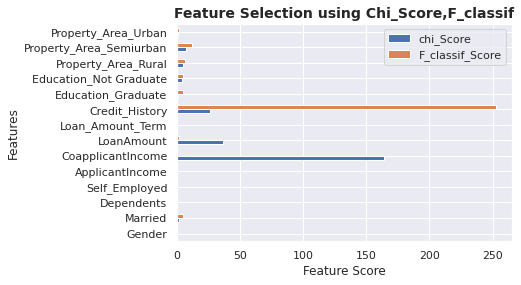

In [49]:
df_KBest=df_chi
df_KBest['F_classif_Score'] = df_fclassif['fclass_Score']
df_KBest.plot(x='Features',y=['chi_Score','F_classif_Score'],kind='barh')
plt.xlabel('Feature Score')
plt.title('Feature Selection using Chi_Score,F_classif',fontsize=14, fontweight='bold')
plt.show()

#### **KBest with Mutual Information** 

We can select features according to the k highest scores. Mutual information (MI) between two random variables is a non-negative value, which measures the dependency between the variables. It is equal to zero if and only if two random variables are independent, and higher values mean higher dependency.

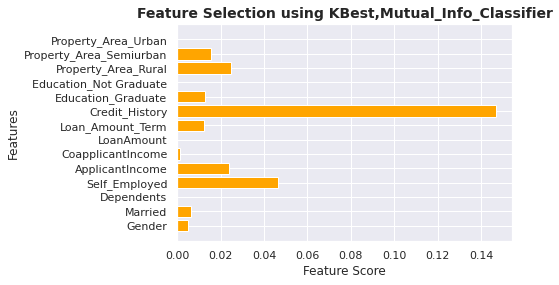

In [50]:
from sklearn.feature_selection import SelectKBest, mutual_info_classif
selector = SelectKBest(mutual_info_classif, k=14)
selector.fit_transform(X, y)
dfscores = pd.DataFrame(selector.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
df_mc_score = pd.concat([dfcolumns,dfscores],axis=1)
df_mc_score.columns = ['Features','mc_Score']  ## naming the dataframe columns
#plt.barh(X.columns, model.feature_importances_,color='blue')
plt.barh(df_mc_score['Features'],df_mc_score['mc_Score'],color='orange')
plt.xlabel('Feature Score')
plt.ylabel('Features')
plt.title('Feature Selection using KBest,Mutual_Info_Classifier',fontsize=14, fontweight='bold')
plt.show()

### Feature Importance using Extra Tree Classifier


Extremely Randomized Trees Classifier(Extra Trees Classifier) is a type of ensemble learning technique which aggregates the results of multiple de-correlated decision trees collected in a “forest” to output it’s classification result. In concept, it is very similar to a Random Forest Classifier and only differs from it in the manner of construction of the decision trees in the forest.

Each Decision Tree in the Extra Trees Forest is constructed from the original training sample. Then, at each test node, Each tree is provided with a random sample of k features from the feature-set from which each decision tree must select the best feature to split the data based on some mathematical criteria (typically the Gini Index). This random sample of features leads to the creation of multiple de-correlated decision trees.

To perform feature selection using the above forest structure, during the construction of the forest, for each feature, the normalized total reduction in the mathematical criteria used in the decision of feature of split (Gini Index if the Gini Index is used in the construction of the forest) is computed. This value is called the Gini Importance of the feature. To perform feature selection, each feature is ordered in descending order according to the Gini Importance of each feature and the user selects the top k features 

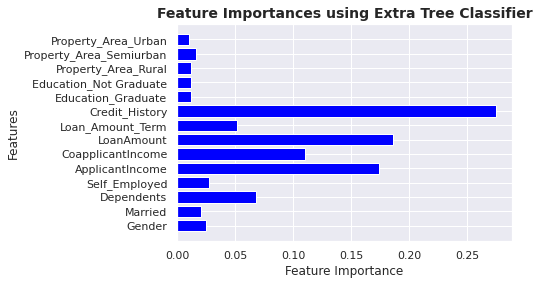

In [51]:
# Feature Importance with Extra Trees Classifier
from sklearn.ensemble import ExtraTreesClassifier
# load data
# feature extraction
model = ExtraTreesClassifier(n_estimators=14)
model.fit(X, y)
# Normalizing the individual importances
#feature_importance_normalized = np.std([model.feature_importances_ for tree in model.estimators_],axis = 0)
# Plotting a Bar Graph to compare the models
dfscores = pd.DataFrame(model.feature_importances_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
df_extra_score = pd.concat([dfcolumns,dfscores],axis=1)
df_extra_score.columns = ['Features','etree_imp']  ## naming the dataframe columns
#plt.barh(X.columns, model.feature_importances_,color='blue')
plt.barh(df_extra_score['Features'],df_extra_score['etree_imp'],color='blue')
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Feature Importances using Extra Tree Classifier',fontsize=14, fontweight='bold')
plt.show()

### Feature Selection using Correlation Value

The correlation feature selection (CFS) measure evaluates subsets of features on the basis of the following hypothesis: "Good feature subsets contain features highly correlated with the classification, yet uncorrelated to each other"

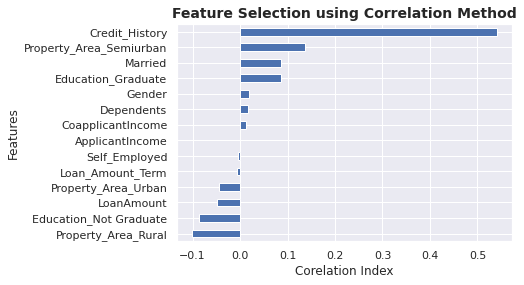

In [58]:
train_corr = train_enc.corr()['Loan_Status'].sort_values(ascending=True).head(14)
top_corr_features = train_corr.index
train_corr.plot(kind='barh')
plt.xlabel('Corelation Index')
plt.ylabel('Features')
plt.title('Feature Selection using Correlation Method',fontsize=14, fontweight='bold')
plt.show()

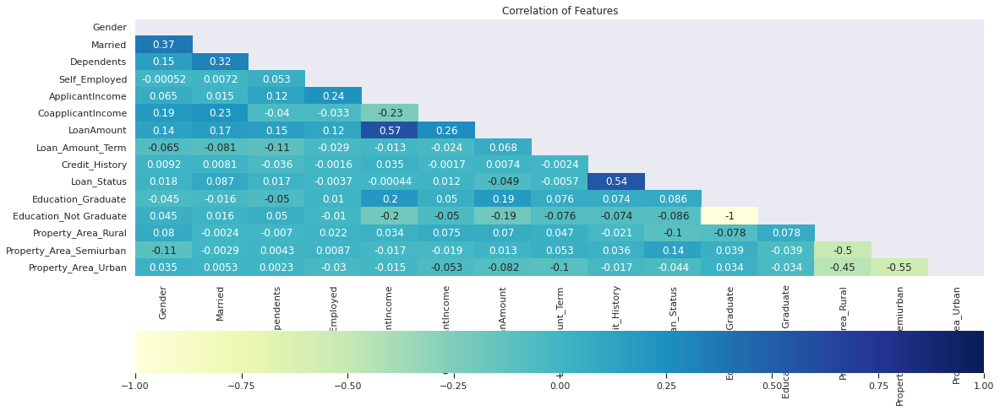

In [60]:
plt.figure(figsize=(18,8))
matrix = np.triu(train_enc.corr())
sns.heatmap(train_enc.corr(), annot=True, mask=matrix,cbar_kws= {'orientation': 'horizontal'} , vmin=-1, vmax=1, center= 0, cmap="YlGnBu")
#sns.heatmap(train_imp.isna().transpose(),cmap="YlGnBu",cbar_kws={'label': 'Missing Data'})
plt.title("Correlation of Features")
sns.set(font_scale=1)

# **3. Exploratory Data Analysis**

## 3.1 Univariate Analysis

### 3.1.1 Bar Chart for Categorical Variables

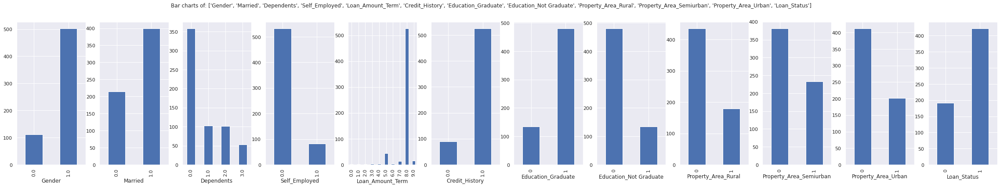

In [61]:
PlotBarCharts(inpData=train_enc, colsToPlot=['Gender', 'Married', 'Dependents', 'Self_Employed', 'Loan_Amount_Term', 'Credit_History', 'Education_Graduate', 'Education_Not Graduate',
       'Property_Area_Rural', 'Property_Area_Semiurban','Property_Area_Urban','Loan_Status'])

### 3.1.2 Plots for Continuous Variables

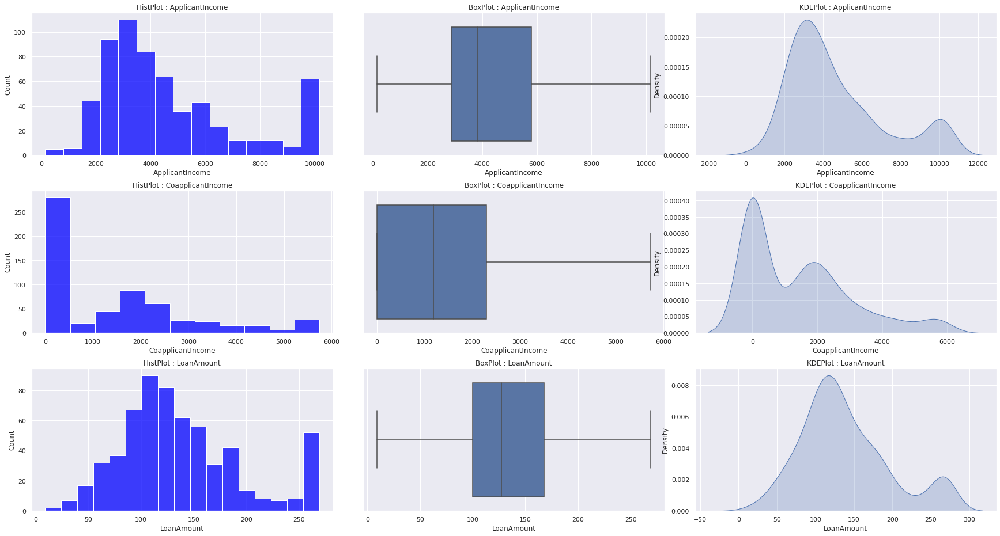

In [62]:
PlotContinousCharts(inpData=train_enc, colsToPlot=ContinuousColsList)

## 3.2 Bivariate Analysis



### 3.2.1 For Categorical Variables with Target Variable

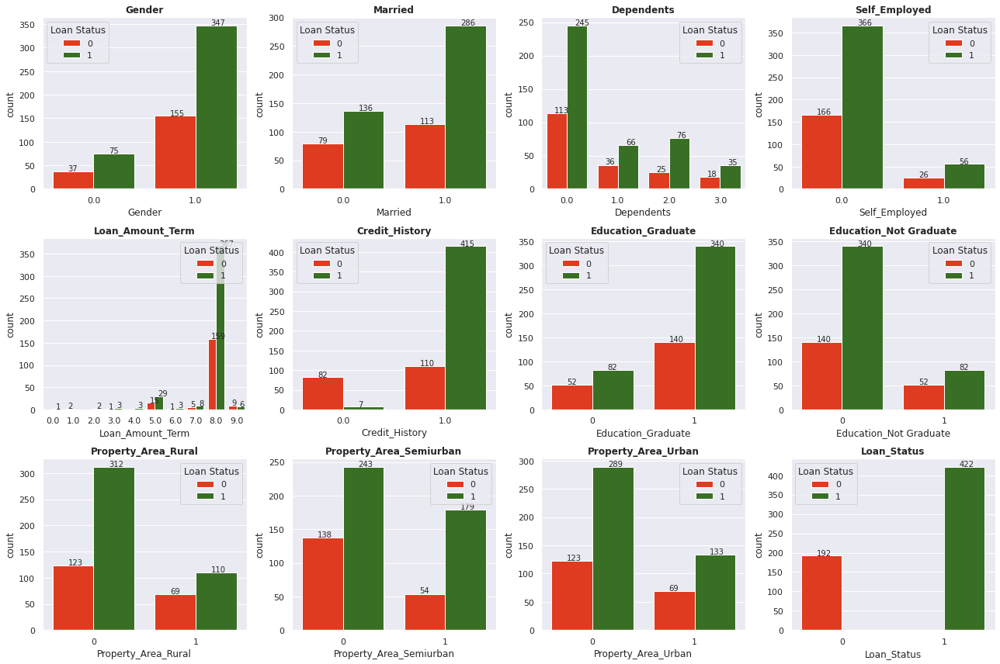

In [63]:
cols = ['Gender', 'Married', 'Dependents', 'Self_Employed', 'Loan_Amount_Term', 'Credit_History', 'Education_Graduate', 'Education_Not Graduate',
       'Property_Area_Rural', 'Property_Area_Semiurban','Property_Area_Urban','Loan_Status']
nr_rows = 3
nr_cols = 4
fig, axs = plt.subplots(nr_rows, nr_cols, figsize=(nr_cols*4.5,nr_rows*4))
for r in range(0,nr_rows):
    for c in range(0,nr_cols):          
        i = r*nr_cols+c       
        ax = axs[r][c]
        sns.countplot(train_enc[cols[i]], hue=train_enc["Loan_Status"], ax=ax,palette=['#FF2400',"#347C17"])
        ax.set_title(cols[i], fontsize=12, fontweight='bold')
        ax.legend(title="Loan Status", loc='best')    
        for p in ax.patches:
            ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.15, p.get_height()+1))        
plt.tight_layout()   

### 3.2.2 For Continuous Variable with Target Variable

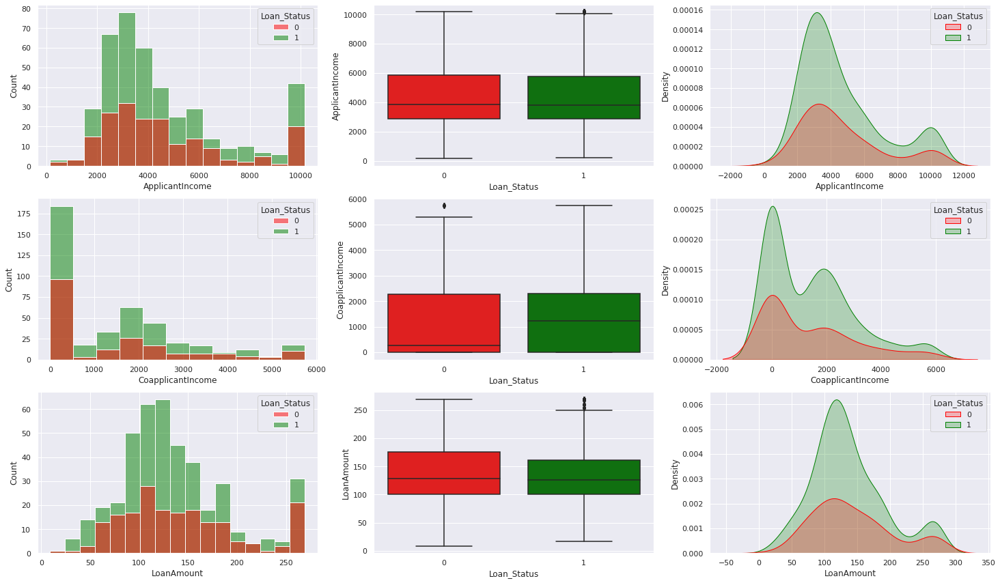

In [64]:
a = 4  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter
fig = plt.figure(figsize=(25,20))
for i in ContinuousColsList:
    plt.subplot(a, b, c)
    plt.xlabel(i)
    sns.histplot(x=train_enc[i],hue=train_enc['Loan_Status'],palette = ["red", "green"])
    c = c + 1
    plt.subplot(a, b, c)
    plt.xlabel(i)
    sns.boxplot(y = i, data = train_enc, x='Loan_Status', palette = ["red", "green"])
    c = c + 1
    plt.subplot(a, b, c)
    plt.xlabel(i)
    sns.kdeplot(data = train_enc, x = i, hue = 'Loan_Status',fill=True,palette = ["red", "green"])
    c = c + 1
plt.show()

## 3.3 Multivariate Analysis

### 3.3.1 Pair Plot

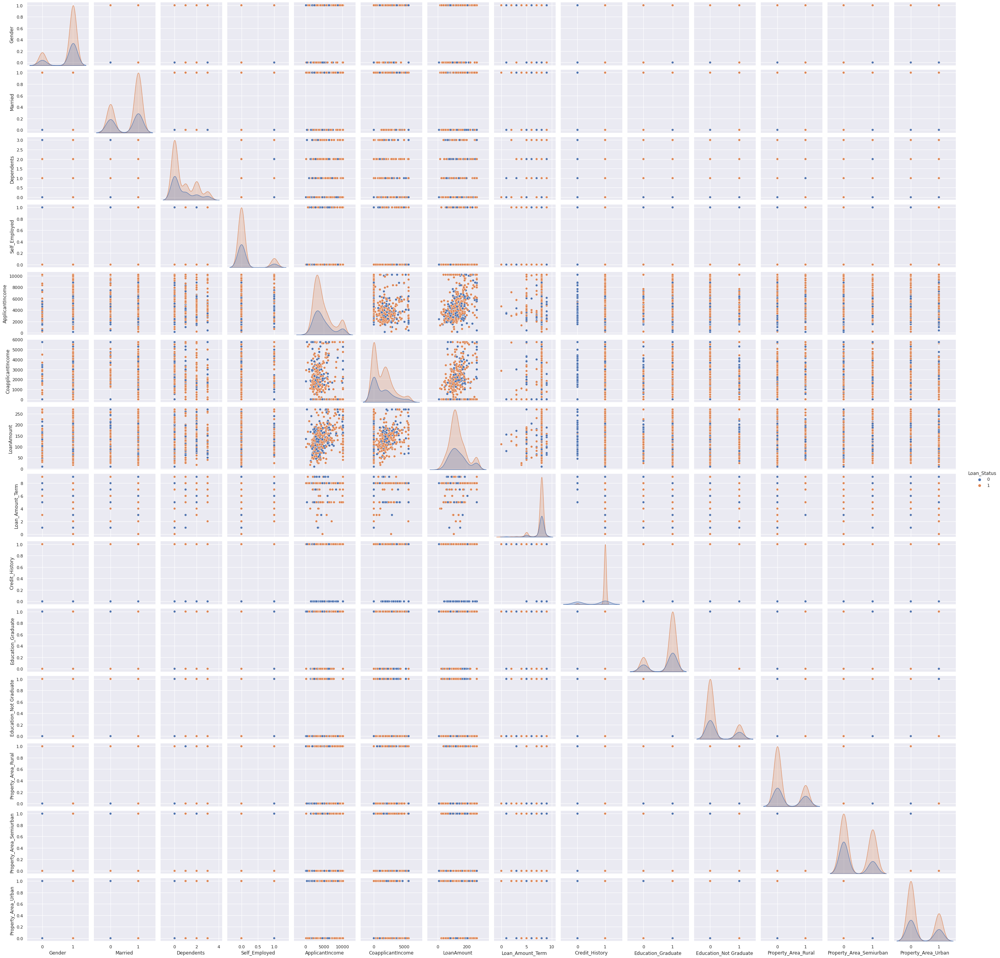

In [65]:
sns.pairplot(train_enc,hue='Loan_Status')

### 3.3.2 Correlation Plot with Clustermap

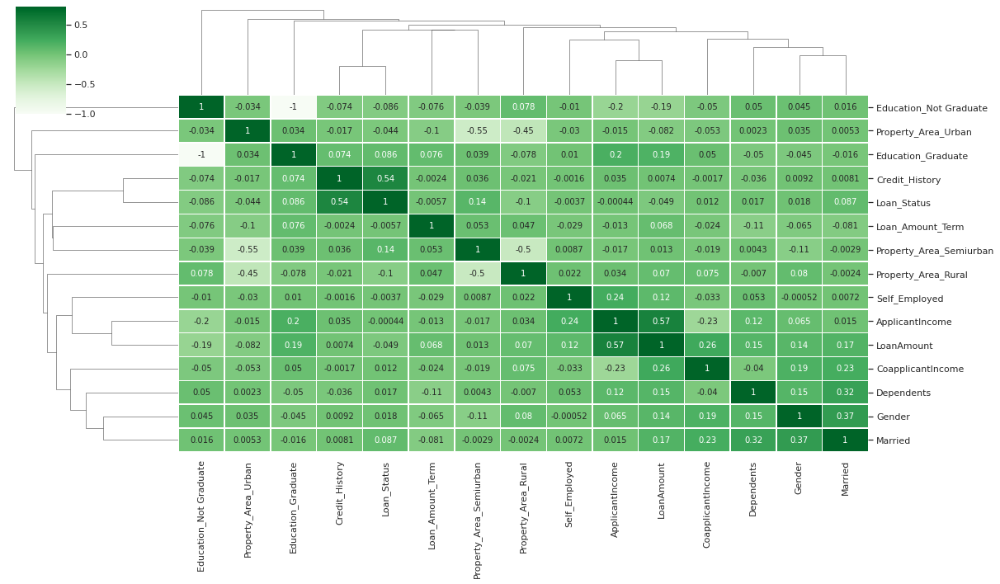

In [66]:
corr = train_enc.corr()
sns.set(font_scale=1)
sns.clustermap(corr, cmap='Greens', vmax=.8, center=0,square=False, linewidths=.5,annot=True, cbar_kws={"shrink": .5},annot_kws={"size": 10},figsize=(17, 10))

# **4. Creation & Evaluation of classifcation models**

#### Importing Classification Model Libraries and Metrics

In [67]:
#sklearn
import time
from sklearn.model_selection import cross_val_score,RepeatedStratifiedKFold,learning_curve,ShuffleSplit
from sklearn.metrics import mean_squared_error,confusion_matrix, precision_score, recall_score, auc,roc_curve,f1_score,log_loss,brier_score_loss,fbeta_score
from sklearn import svm,model_selection, tree, linear_model, naive_bayes, ensemble,gaussian_process

### 3.1. Preparing Data for Classification

#### Definining Predictors and Output

In [68]:
print(train_enc.columns)

Index(['Gender', 'Married', 'Dependents', 'Self_Employed', 'ApplicantIncome',
       'CoapplicantIncome', 'LoanAmount', 'Loan_Amount_Term', 'Credit_History',
       'Loan_Status', 'Education_Graduate', 'Education_Not Graduate',
       'Property_Area_Rural', 'Property_Area_Semiurban',
       'Property_Area_Urban'],
      dtype='object')


In [69]:
# Separate Target Variable and Predictor Variables
TargetVariable='Loan_Status'
Predictors_All=['Gender', 'Married', 'Dependents', 'Self_Employed', 'ApplicantIncome','CoapplicantIncome', 'LoanAmount', 'Loan_Amount_Term', 'Credit_History','Education_Graduate', 'Education_Not Graduate',
       'Property_Area_Rural', 'Property_Area_Semiurban','Property_Area_Urban']

#### Define Classification Algorithms for Prediction

In [70]:
MLA = [
    #Ensemble Methods
    ensemble.AdaBoostClassifier(n_estimators=75, random_state=7),
    ensemble.BaggingClassifier(n_estimators=75, random_state=7),
    ensemble.ExtraTreesClassifier(n_estimators=75, random_state=7),
    ensemble.GradientBoostingClassifier(n_estimators=75, random_state=7),
    ensemble.RandomForestClassifier(n_estimators=75, random_state=7),

    #Gaussian Processes
    gaussian_process.GaussianProcessClassifier(),
    
    #GLM
    linear_model.LogisticRegressionCV(),
    linear_model.PassiveAggressiveClassifier(),
    linear_model.RidgeClassifierCV(),
    linear_model.SGDClassifier(),
    linear_model.Perceptron(),
    
    #Navies Bayes
    naive_bayes.BernoulliNB(),
    naive_bayes.GaussianNB(),
    naive_bayes.MultinomialNB(),
    
    #SVM
    svm.SVC(probability=True),
    svm.NuSVC(probability=True),
    svm.LinearSVC(),
    
    #Trees    
    tree.DecisionTreeClassifier(),
    tree.ExtraTreeClassifier(),   
    ]

#### Define Dataframe for Different Performance Values for Machine Learning Models

In [71]:
def Models(Xtrain,ytrain,xtest,ytest):
  MLA_columns = []
  MLA_compare = pd.DataFrame(columns = MLA_columns)
  kfold = model_selection.KFold(n_splits=10, random_state=None)
  rfold = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
  row_index = 0
  for alg in MLA:    
      predicted = alg.fit(X_train, y_train).predict(X_test)
      fp, tp, th = roc_curve(y_test, predicted)
      MLA_name = alg.__class__.__name__
      MLA_compare.loc[row_index,'Model Name'] = MLA_name
      MLA_compare.loc[row_index, 'Train Accuracy'] = round(alg.score(X_train, y_train), 4)
      MLA_compare.loc[row_index, 'Test Accuracy'] = round(alg.score(X_test, y_test), 4)
      MLA_compare.loc[row_index, 'Precision'] = round(precision_score(y_test, predicted),4)
      MLA_compare.loc[row_index, 'Recall'] = round(recall_score(y_test, predicted),4)
      MLA_compare.loc[row_index, 'AUC'] = auc(fp, tp)
      MLA_compare.loc[row_index, 'f1_macro'] = round(f1_score(y_test, predicted, average = "macro"),4)
      MLA_compare.loc[row_index, 'f1_micro'] = round(f1_score(y_test, predicted, average = "micro"),4)
      MLA_compare.loc[row_index, 'f1_weighted'] = round(f1_score(y_test, predicted, average = "weighted"),4)
      MLA_compare.loc[row_index, 'f_beta'] = round(fbeta_score(y_test, predicted, beta=4),4)
      MLA_compare.loc[row_index, 'Logloss'] = round(log_loss(y_test, predicted),4)
      MLA_compare.loc[row_index, 'Brier Score Loss'] = round(brier_score_loss(y_test, predicted),4)
      row_index+=1
  return MLA_compare

#### Define ROC Curve Plotting

In [72]:
def PlotRocCurve(X_train,y_train,X_test,y_test):
  index = 0
  fig, ax = plt.subplots(1, figsize=(15, 8))
  for alg in MLA:
      predicted = alg.fit(X_train, y_train).predict(X_test)
      fp, tp, th = roc_curve(y_test, predicted)
      roc_auc_mla = auc(fp, tp)
      MLA_name = alg.__class__.__name__
      plt.plot(fp, tp, lw=2, alpha=0.3, label='ROC %s (AUC = %0.2f)'  % (MLA_name, roc_auc_mla)) 
      index=index+1

  plt.title('ROC Curve comparison',fontsize=14, fontweight='bold')
  plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
  plt.plot([0,1],[0,1],'b--')
  plt.xlim([0,1])
  plt.grid(False)
  plt.ylim([0,1])
  plt.ylabel('True Positive Rate')
  plt.xlabel('False Positive Rate')    
  plt.show()

#### Define Plotting Confusion Matrix

In [73]:
def PlotConfusionMatrix(X_test, y_test):
  import sklearn
  index = 0
  for alg in MLA:
      MLA_name = alg.__class__.__name__
      sklearn.metrics.plot_confusion_matrix(alg, X_test, y_test, display_labels=['N', 'Y'],cmap=plt.cm.Blues)
      plt.grid(False)
      plt.title('Confusion Matrix : '+MLA_name,fontsize=14, fontweight='bold')
      index+=1  
  plt.show()

#### Define Plotting of Learning Curves

In [74]:
def plot_learning_curve(estimator, title, X, y, axes=None, ylim=None, cv=None,
                        n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    """
    Generate 3 plots: the test and training learning curve, the training
    samples vs fit times curve, the fit times vs score curve.
    """
    if axes is None:
        _, axes = plt.subplots(1, 3, figsize=(25, 7))

    axes[0].set_title('Learning Curve of the Model : '+title,fontsize=14, fontweight='bold')
    if ylim is not None:
        axes[0].set_ylim(*ylim)
    axes[0].set_xlabel("Training examples")
    axes[0].set_ylabel("Score")

    train_sizes, train_scores, test_scores, fit_times, _ = \
        learning_curve(estimator, X, y, cv=cv, n_jobs=n_jobs,
                       train_sizes=train_sizes,
                       return_times=True)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    fit_times_mean = np.mean(fit_times, axis=1)
    fit_times_std = np.std(fit_times, axis=1)

    # Plot learning curve
    axes[0].grid()
    axes[0].fill_between(train_sizes, train_scores_mean - train_scores_std,
                         train_scores_mean + train_scores_std, alpha=0.1,
                         color="g")
    axes[0].fill_between(train_sizes, test_scores_mean - test_scores_std,
                         test_scores_mean + test_scores_std, alpha=0.1,
                         color="r")
    axes[0].plot(train_sizes, train_scores_mean, 'o-', color="darkgreen",
                 label="Training score")
    axes[0].plot(train_sizes, test_scores_mean, '*-', color="darkred",
                 label="Cross-validation score")
    axes[0].legend(loc="best")

    # Plot n_samples vs fit_times
    axes[1].grid()
    axes[1].plot(train_sizes, fit_times_mean, 'o-',color='orange')
    axes[1].fill_between(train_sizes, fit_times_mean - fit_times_std,
                         fit_times_mean + fit_times_std, alpha=0.1,color='darkorange')
    axes[1].set_xlabel("Training examples")
    axes[1].set_ylabel("fit_times")
    axes[1].set_title("Scalability of the Model : "+title,fontsize=14, fontweight='bold')

    # Plot fit_time vs score
    axes[2].grid()
    axes[2].plot(fit_times_mean, test_scores_mean, 'o-',color='darkblue')
    axes[2].fill_between(fit_times_mean, test_scores_mean - test_scores_std,
                         test_scores_mean + test_scores_std, alpha=0.1,color='b')
    axes[2].set_xlabel("fit_times")
    axes[2].set_ylabel("Score")
    axes[2].set_title("Performance of the Model : "+title,fontsize=14, fontweight='bold')
    return plt

#### Plotting Performance Curves

In [75]:
def plotperfcurves(X,y):
  index = 0
  for alg in MLA:
      MLA_name = alg.__class__.__name__
      estimator = alg
      title = MLA_name
      plot_learning_curve(estimator, title, X, y,  ylim=(0.4, 1.05),cv=5, n_jobs=4)
      plt.show()

### BinaryClass ROC Curve 

### 3.2 Splitting to training and test data

In [76]:
X = train_enc.drop(columns=['Loan_Status'])
y = train_enc['Loan_Status']

In [77]:
# Split the data into training and testing set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

### **Output 1** - All Features considered in model building

#### Learning Curve, Scalability and Performance Plots

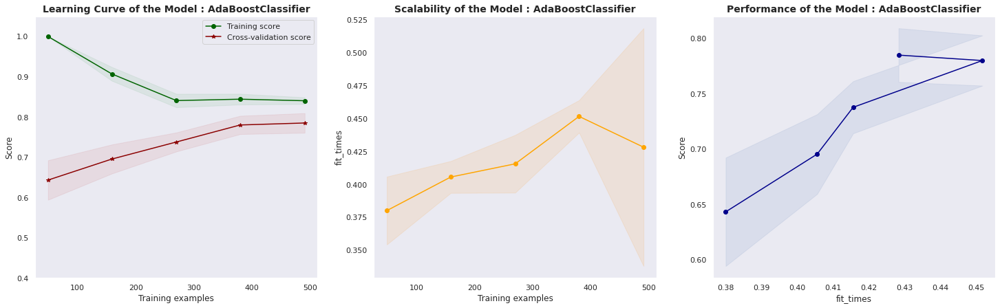

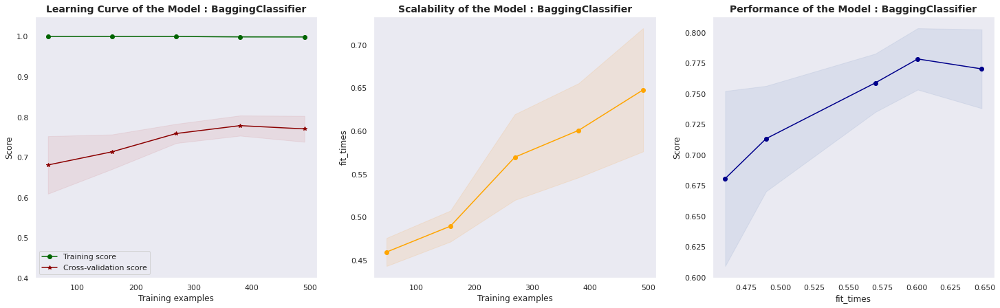

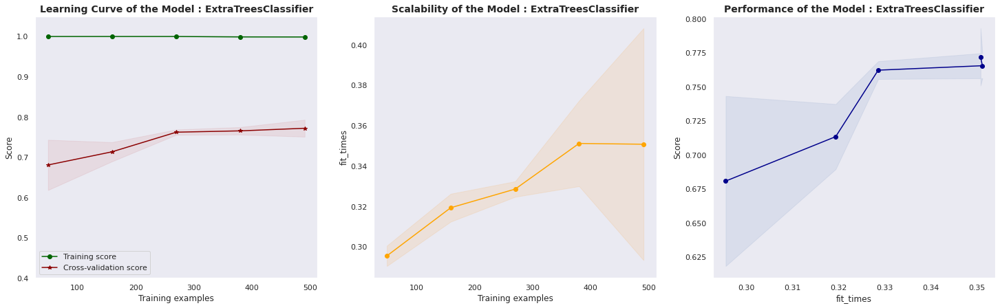

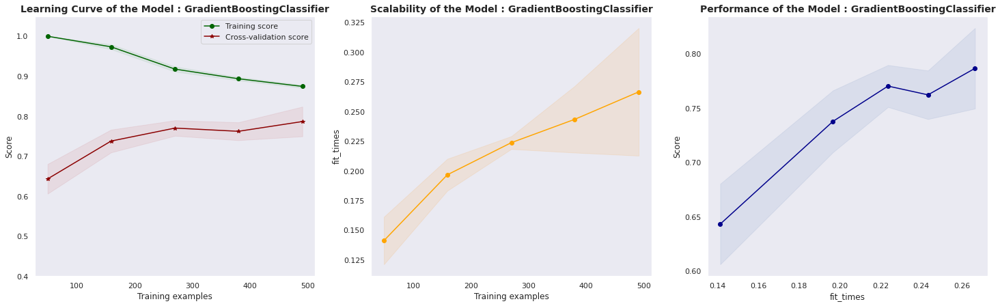

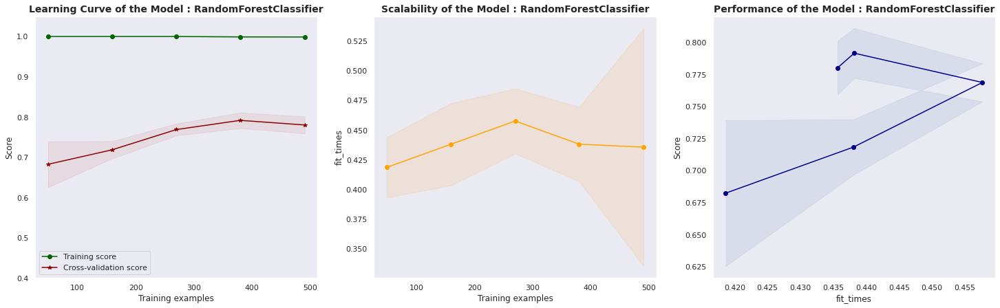

...

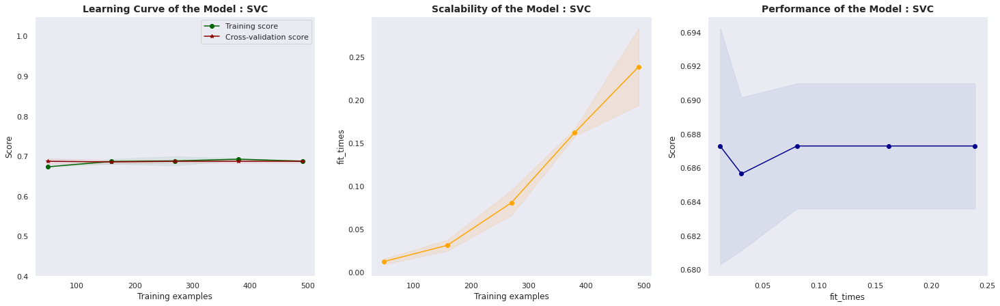

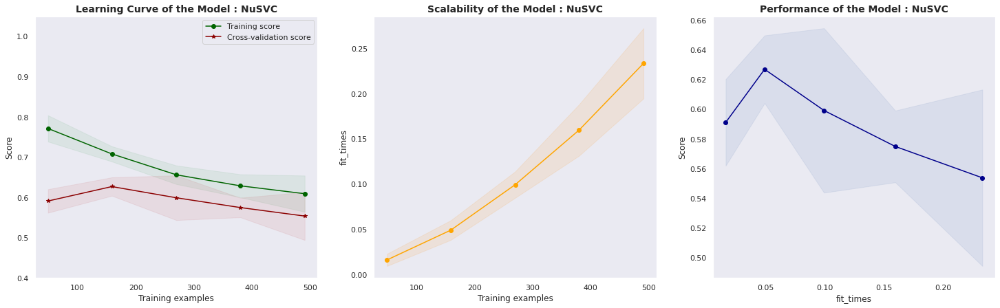

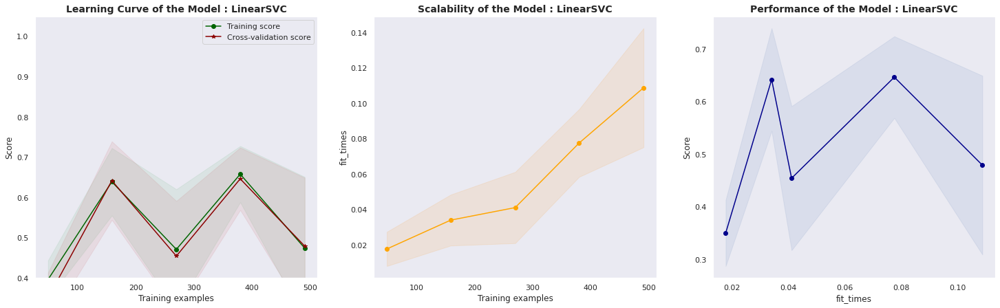

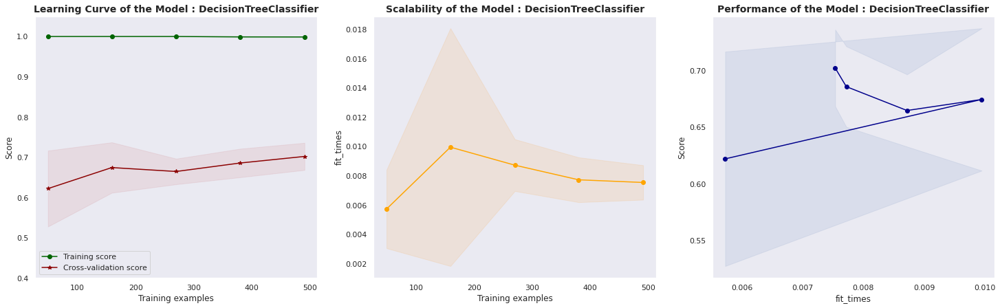

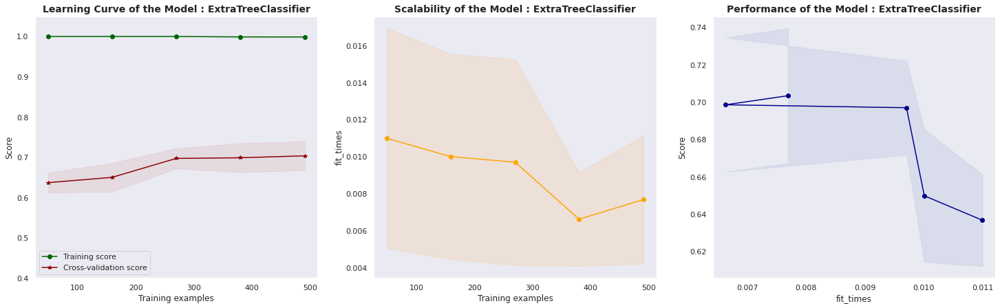

In [78]:
plotperfcurves(X,y)

#### Classification Model Report

In [79]:
All_Features = Models(X_train,y_train,X_test,y_test)
All_Features

,Model Name,Train Accuracy,Test Accuracy,Precision,Recall,AUC,f1_macro,f1_micro,f1_weighted,f_beta,Logloss,Brier Score Loss
0,AdaBoostClassifier,0.8513,0.7805,0.7755,0.9383,0.707231,0.7231,0.7805,0.7631,0.9268,7.5818,0.2195
1,BaggingClassifier,0.9980,0.7642,0.7826,0.8889,0.706349,0.7176,0.7642,0.7540,0.8818,8.1434,0.2358
2,ExtraTreesClassifier,0.9980,0.7561,0.7865,0.8642,0.705908,0.7144,0.7561,0.7490,0.8592,8.4242,0.2439
3,GradientBoostingClassifier,0.8737,0.7642,0.7766,0.9012,0.700617,0.7129,0.7642,0.7514,0.8928,8.1434,0.2358
4,RandomForestClassifier,0.9980,0.7724,0.7912,0.8889,0.718254,0.7294,0.7724,0.7636,0.8825,7.8626,0.2276
5,GaussianProcessClassifier,0.9959,0.3984,0.5897,0.2840,0.451499,0.3980,0.3984,0.3934,0.2929,20.7795,0.6016
6,LogisticRegressionCV,0.8147,0.7886,0.7723,0.9630,0.707672,0.7254,0.7886,0.7672,0.9492,7.3010,0.2114
7,PassiveAggressiveClassifier,0.6945,0.6585,0.6585,1.0000,0.500000,0.3971,0.6585,0.5230,0.9704,11.7940,0.3415
8,RidgeClassifierCV,0.8126,0.7967,0.7745,0.9753,0.713845,0.7333,0.7967,0.7745,0.9607,7.0202,0.2033
9,SGDClassifier,0.7067,0.6585,0.6612,0.9877,0.505732,0.4188,0.6585,0.5371,0.9598,11.7940,0.3415


#### F Score Bar Charts

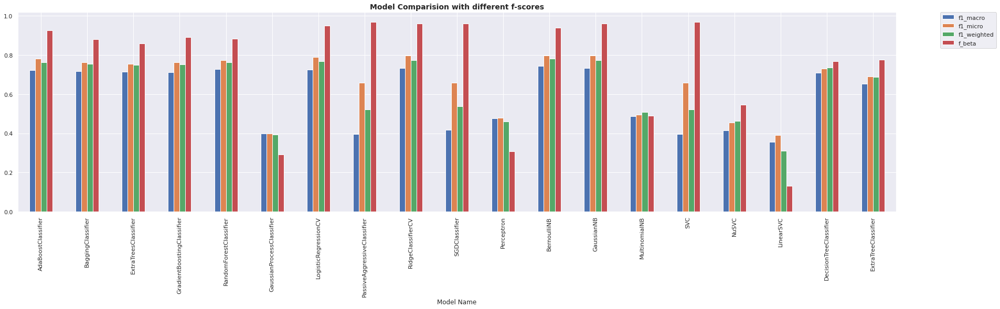

In [80]:
All_Features.plot(x="Model Name",y=["f1_macro","f1_micro","f1_weighted","f_beta"],kind="bar",figsize=(30, 7))
plt.xticks(rotation=90)
plt.title('Model Comparision with different f-scores',fontsize=14, fontweight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

#### Log Loss Chart

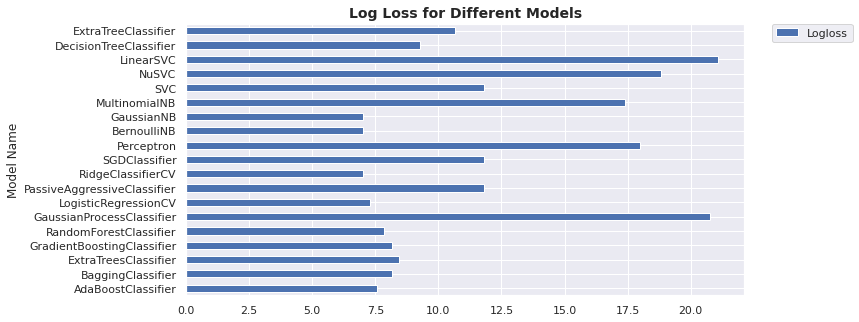

In [81]:
All_Features.plot(x="Model Name",y=["Logloss"],kind="barh",figsize=(10, 5))
plt.xticks(rotation=360)
plt.title('Log Loss for Different Models',fontsize=14, fontweight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

#### ROC Comparision Curve

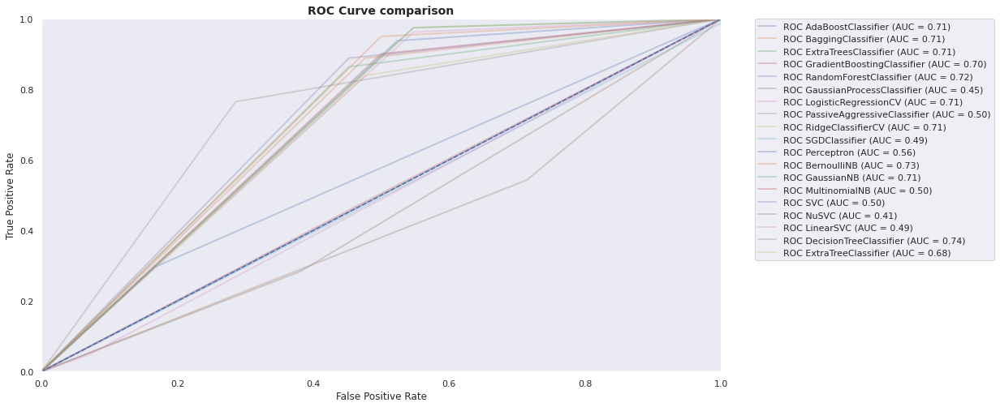

In [82]:
PlotRocCurve(X_train,y_train,X_test,y_test)

### **Output 2** - With Reduced Features considered in model building

In [83]:
train= X_train
train['Loan_Status']=y_train
test=X_test
test['Loan_Status']=y_test

In [84]:
X_train_new = train[['Gender', 'Married', 'Credit_History','Education_Graduate','Property_Area_Rural', 'Property_Area_Semiurban','Property_Area_Urban']]
y_train_new= y_train
X_test_new = X_test[['Gender', 'Married', 'Credit_History','Education_Graduate', 'Property_Area_Rural', 'Property_Area_Semiurban','Property_Area_Urban']]
y_test_new =y_test

In [85]:
y_red = train_features['Loan_Status']
X_red = train_features[['Gender', 'Married', 'Credit_History','Education_Graduate','Property_Area_Rural', 'Property_Area_Semiurban','Property_Area_Urban']]
X_train_red, X_test_red, y_train_red, y_test_red = train_test_split(X_red, y_red, test_size=0.20)

#### Classification Model Report

In [86]:
Reduced_Features = Models(X_train_new,y_train_new,X_test_new,y_test_new)
Reduced_Features

,Model Name,Train Accuracy,Test Accuracy,Precision,Recall,AUC,f1_macro,f1_micro,f1_weighted,f_beta,Logloss,Brier Score Loss
0,AdaBoostClassifier,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
1,BaggingClassifier,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
2,ExtraTreesClassifier,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
3,GradientBoostingClassifier,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
4,RandomForestClassifier,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
5,GaussianProcessClassifier,1.0000,0.4065,0.6053,0.2840,0.463404,0.4059,0.4065,0.3997,0.2931,20.4987,0.5935
6,LogisticRegressionCV,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
7,PassiveAggressiveClassifier,0.6945,0.6585,0.6585,1.0000,0.500000,0.3971,0.6585,0.5230,0.9704,11.7940,0.3415
8,RidgeClassifierCV,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
9,SGDClassifier,0.6945,0.6667,0.6639,1.0000,0.511905,0.4223,0.6667,0.5414,0.9711,11.5132,0.3333


#### ROC Comparision Curve

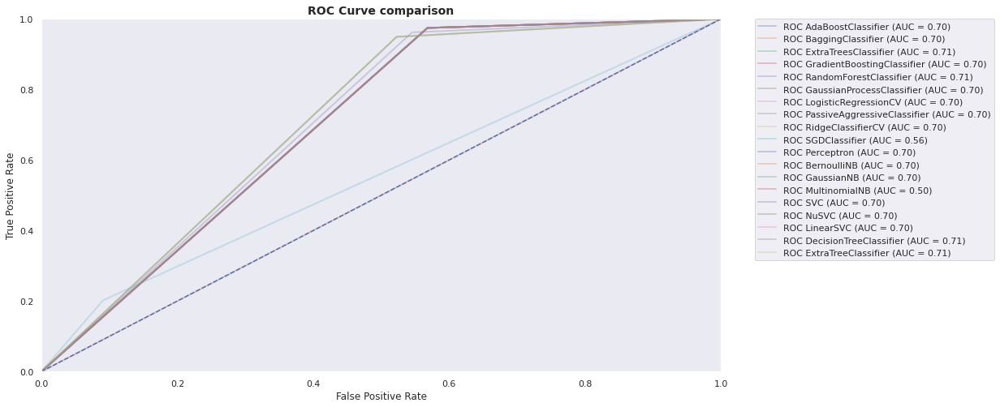

In [87]:
PlotRocCurve(X_train_red,y_train_red,X_test_red,y_test_red)

#### F Score Bar Charts

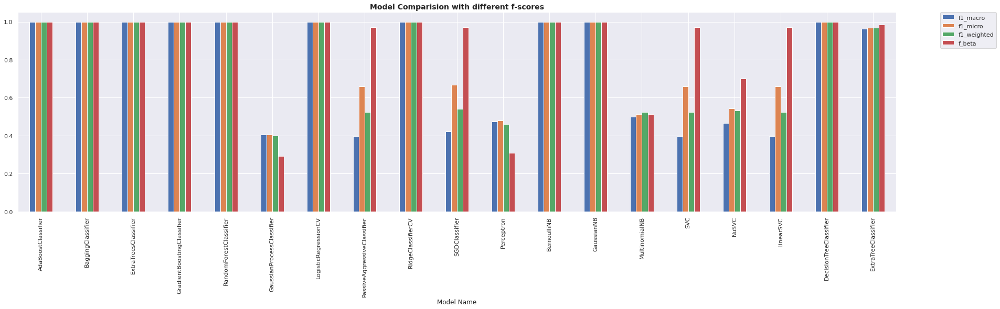

In [88]:
Reduced_Features.plot(x="Model Name",y=["f1_macro","f1_micro","f1_weighted","f_beta"],kind="bar",figsize=(30, 7))
plt.xticks(rotation=90)
plt.title('Model Comparision with different f-scores',fontsize=14, fontweight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

#### Log Loss Chart

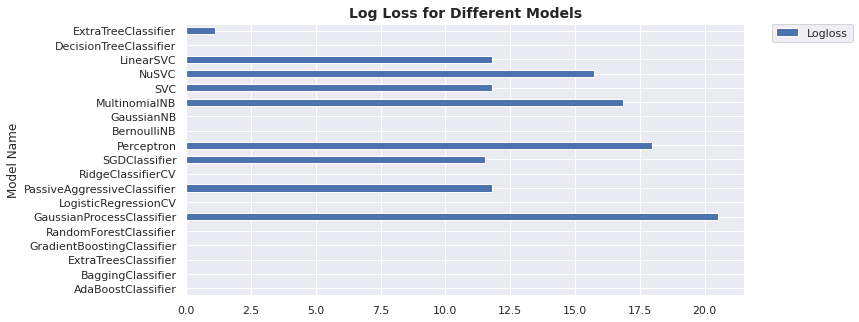

In [89]:
Reduced_Features.plot(x="Model Name",y=["Logloss"],kind="barh",figsize=(10, 5))
plt.xticks(rotation=360)
plt.title('Log Loss for Different Models',fontsize=14, fontweight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

#### Learning Curve, Scalability and Performance Plots

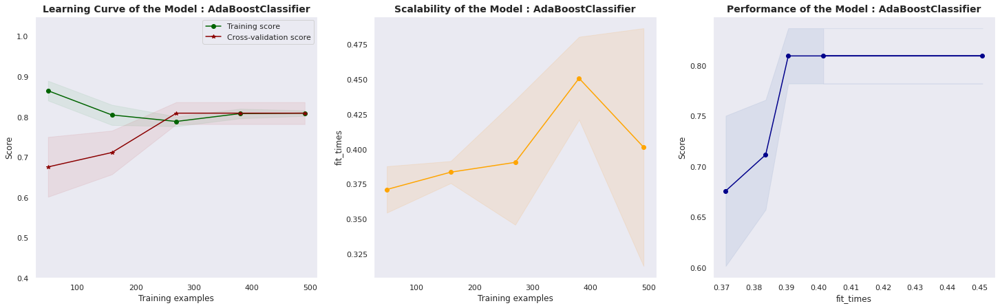

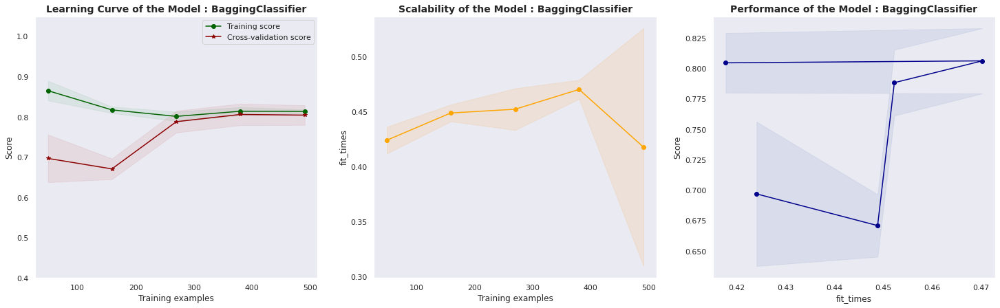

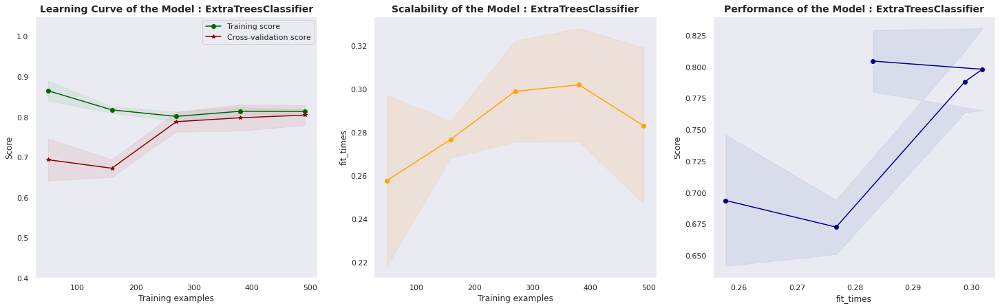

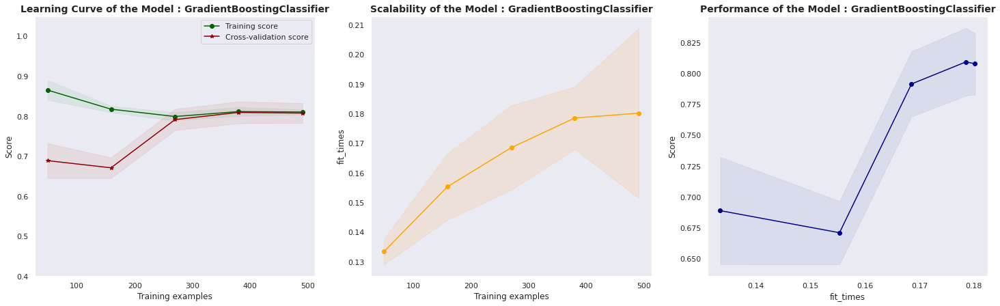

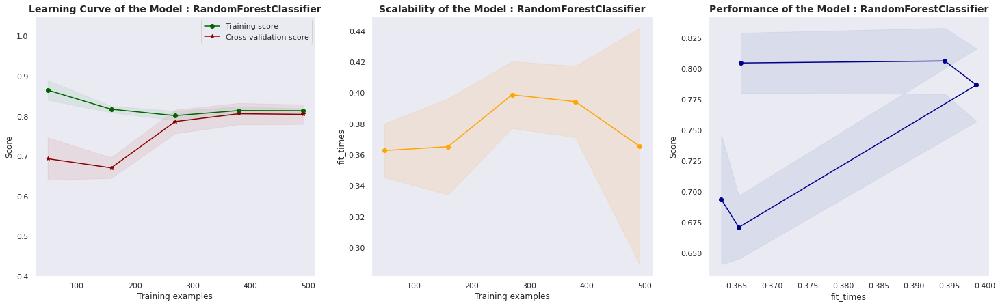

...

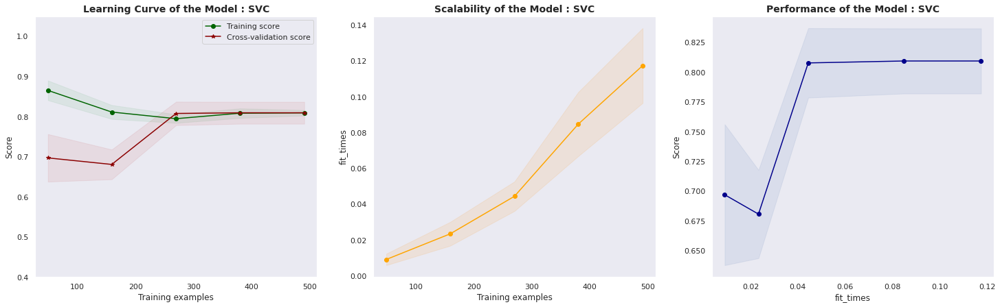

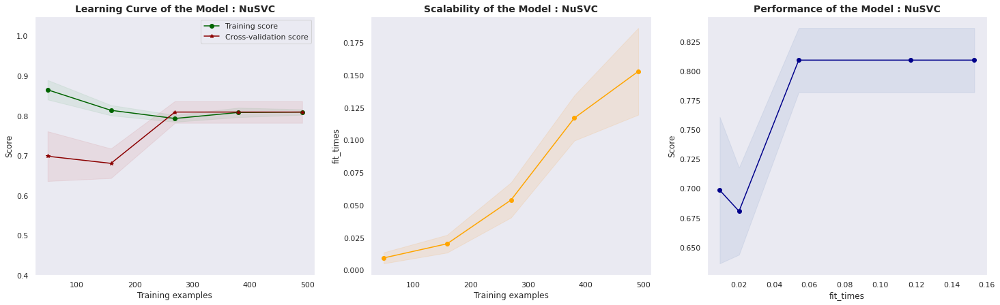

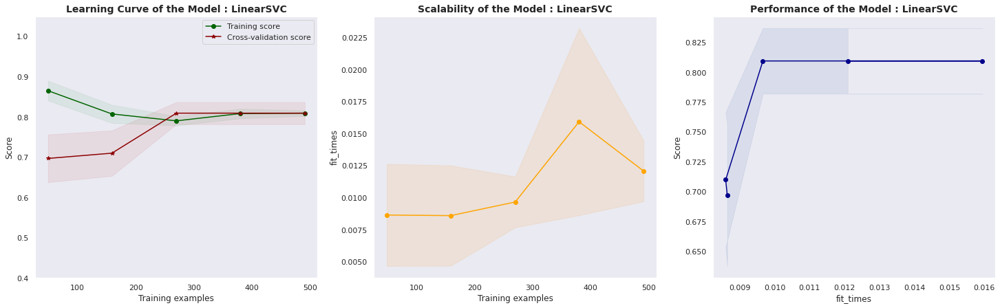

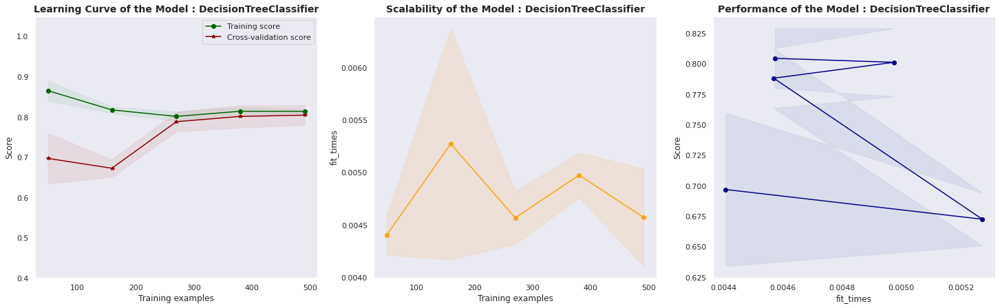

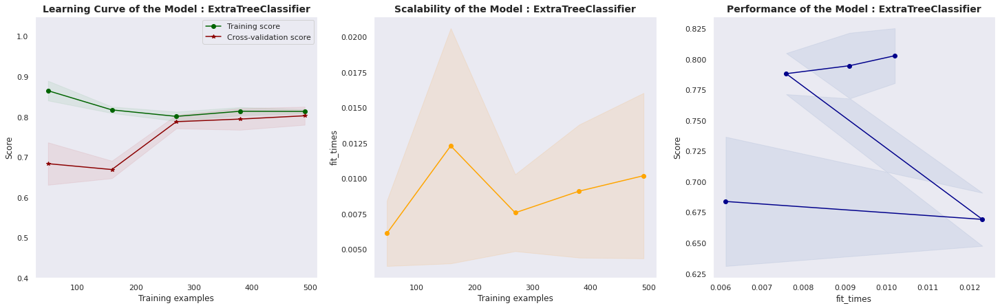

In [90]:
plotperfcurves(X_red,y_red)

### **Output 3** - With All Features - Oversampling

In [91]:
from imblearn.over_sampling import SMOTE
smote = SMOTE()
# fit predictor and target variable
x_smote, y_smote = smote.fit_resample(X, y)
X_train_os, X_test_os, y_train_os, y_test_os = train_test_split(x_smote, y_smote, test_size=0.20)

#### Classification Model Report

In [92]:
All_OverSampling = Models(X_train_os,y_train_os,X_test_os,y_test_os)
All_OverSampling

,Model Name,Train Accuracy,Test Accuracy,Precision,Recall,AUC,f1_macro,f1_micro,f1_weighted,f_beta,Logloss,Brier Score Loss
0,AdaBoostClassifier,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
1,BaggingClassifier,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
2,ExtraTreesClassifier,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
3,GradientBoostingClassifier,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
4,RandomForestClassifier,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
5,GaussianProcessClassifier,1.0000,0.4065,0.6053,0.2840,0.463404,0.4059,0.4065,0.3997,0.2931,20.4987,0.5935
6,LogisticRegressionCV,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
7,PassiveAggressiveClassifier,0.6945,0.6585,0.6585,1.0000,0.500000,0.3971,0.6585,0.5230,0.9704,11.7940,0.3415
8,RidgeClassifierCV,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
9,SGDClassifier,0.6945,0.6667,0.6639,1.0000,0.511905,0.4223,0.6667,0.5414,0.9711,11.5132,0.3333


#### ROC Curve Comparision

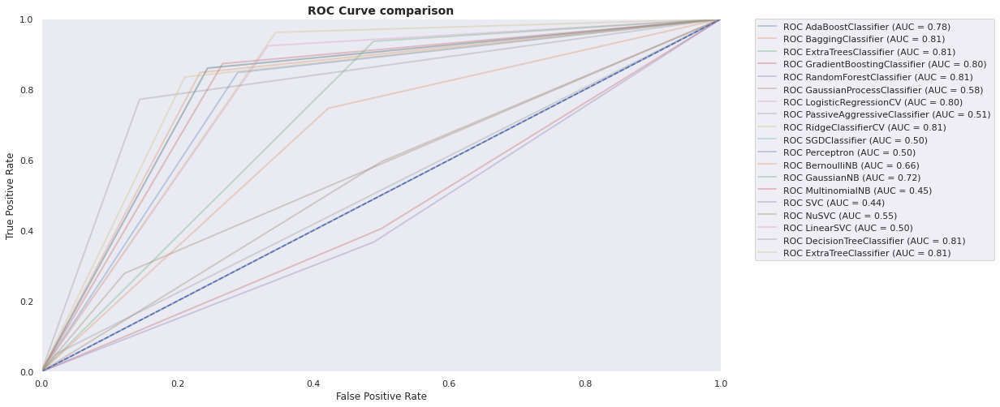

In [93]:
PlotRocCurve(X_train_os,y_train_os,X_test_os,y_test_os)

#### F Score Bar Charts

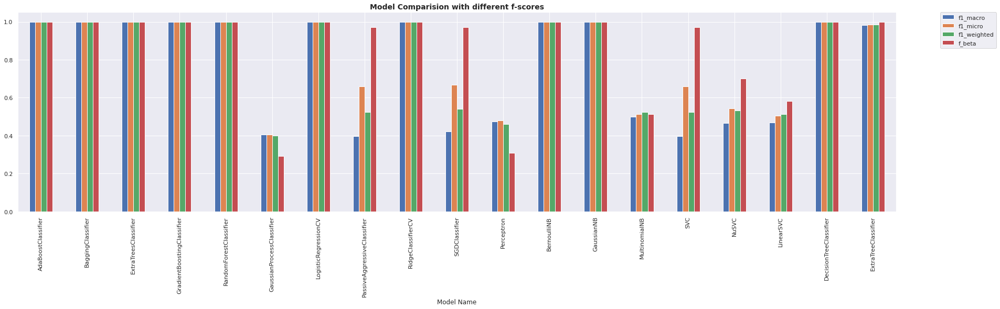

In [94]:
All_OverSampling.plot(x="Model Name",y=["f1_macro","f1_micro","f1_weighted","f_beta"],kind="bar",figsize=(30, 7))
plt.xticks(rotation=90)
plt.title('Model Comparision with different f-scores',fontsize=14, fontweight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

####  Log Loss Bar Chart

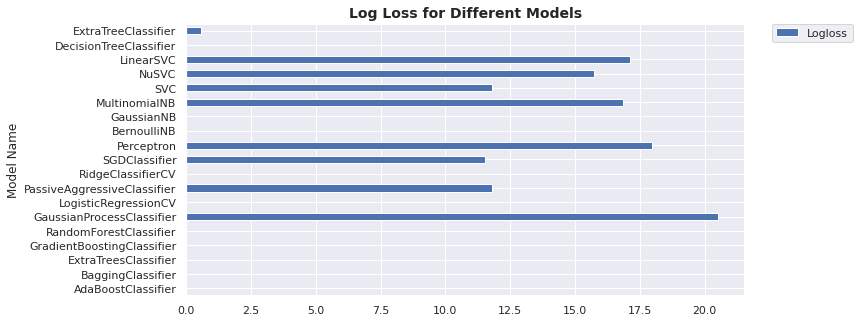

In [95]:
All_OverSampling.plot(x="Model Name",y=["Logloss"],kind="barh",figsize=(10, 5))
plt.xticks(rotation=360)
plt.title('Log Loss for Different Models',fontsize=14, fontweight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

#### Learning Curve, Scalability and Performance Plots

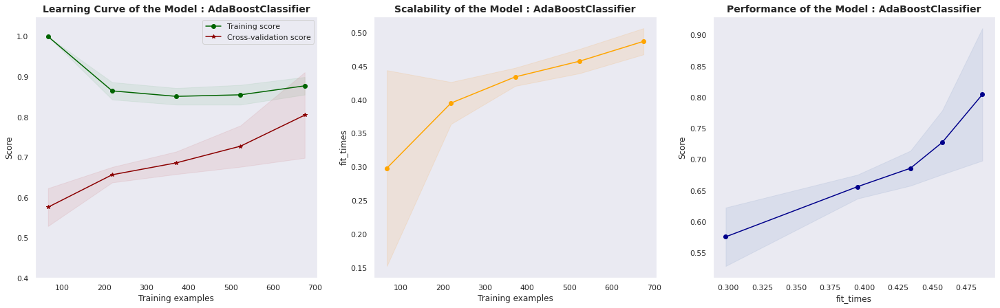

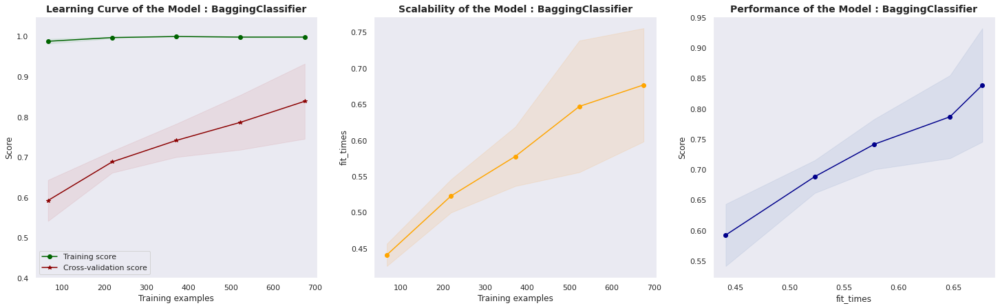

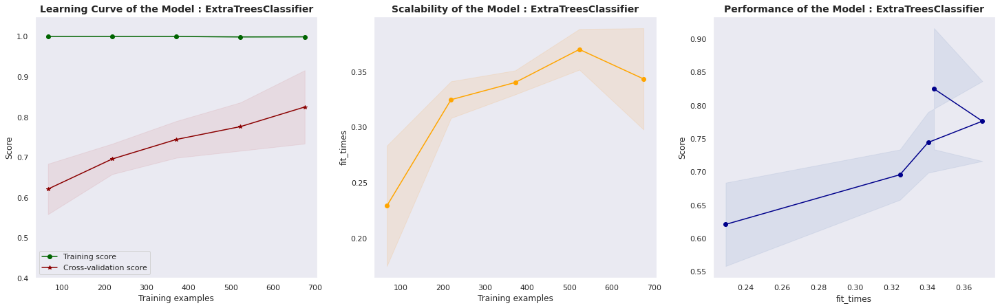

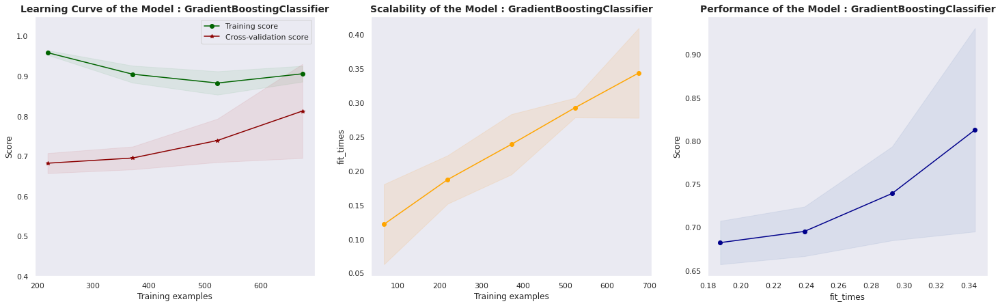

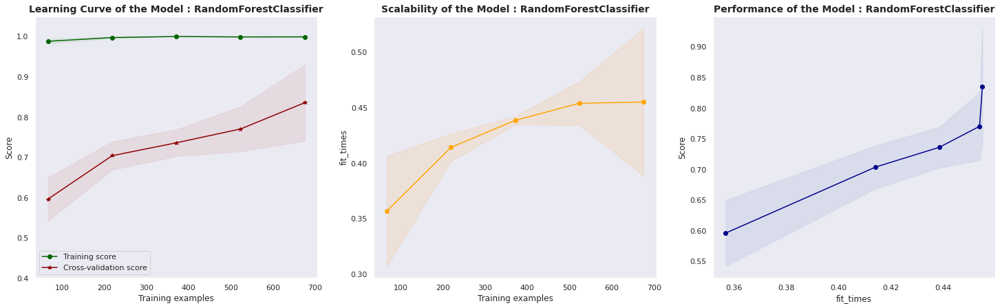

...

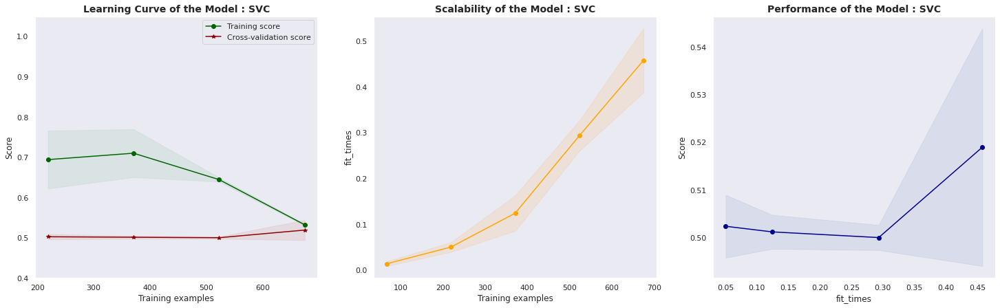

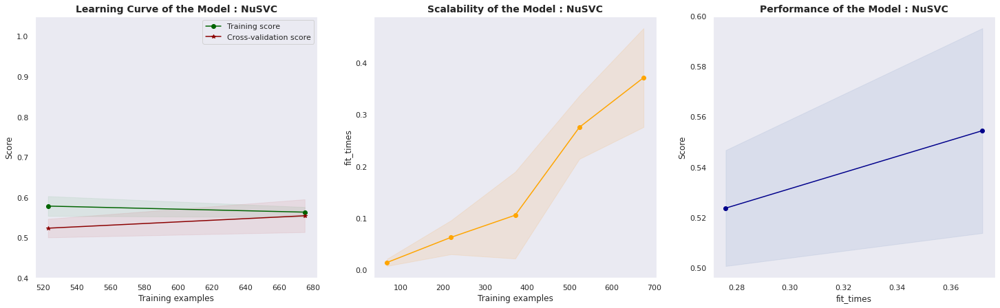

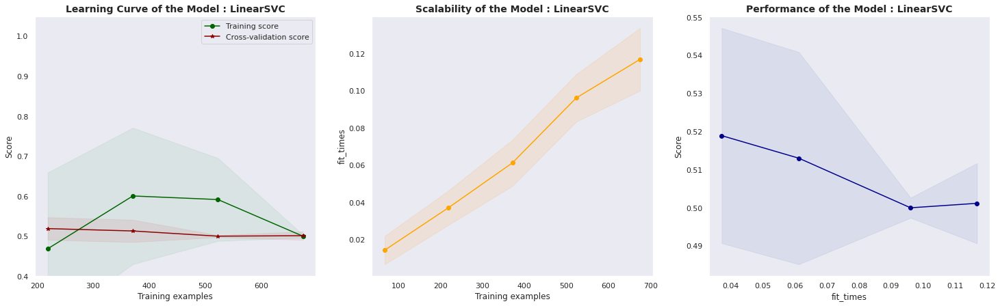

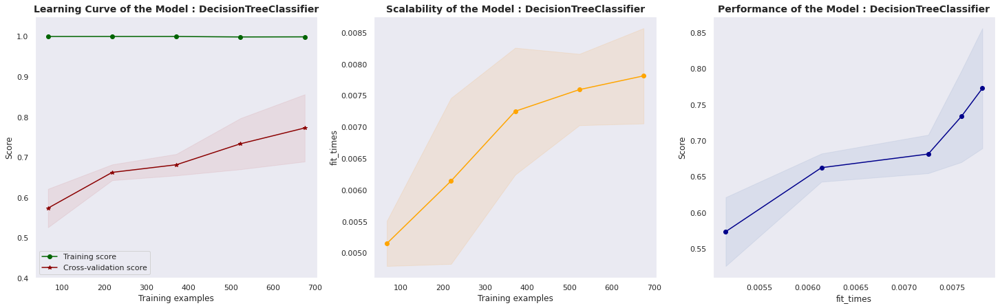

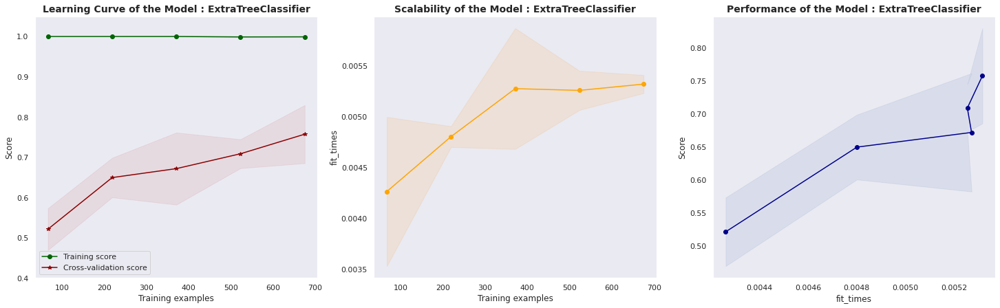

In [96]:
plotperfcurves(x_smote,y_smote)

### **Output 4** - With Reduced Features Oversampling

In [97]:
from imblearn.over_sampling import SMOTE
smote = SMOTE()
# fit predictor and target variable
x_smote_red, y_smote_red = smote.fit_resample(X_red, y_red)
X_train_red_os, X_test_red_os, y_train_red_os, y_test_red_os = train_test_split(x_smote_red, y_smote_red, test_size=0.20)

#### Classification Model Report

In [98]:
Red_OverSampling = Models(X_train_red_os,y_train_red_os,X_test_red_os,y_test_red_os)
Red_OverSampling

,Model Name,Train Accuracy,Test Accuracy,Precision,Recall,AUC,f1_macro,f1_micro,f1_weighted,f_beta,Logloss,Brier Score Loss
0,AdaBoostClassifier,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
1,BaggingClassifier,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
2,ExtraTreesClassifier,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
3,GradientBoostingClassifier,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
4,RandomForestClassifier,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
5,GaussianProcessClassifier,1.0000,0.4065,0.6053,0.2840,0.463404,0.4059,0.4065,0.3997,0.2931,20.4987,0.5935
6,LogisticRegressionCV,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
7,PassiveAggressiveClassifier,0.6945,0.6585,0.6585,1.0000,0.500000,0.3971,0.6585,0.5230,0.9704,11.7940,0.3415
8,RidgeClassifierCV,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
9,SGDClassifier,0.3055,0.3415,0.0000,0.0000,0.500000,0.2545,0.3415,0.1738,0.0000,22.7450,0.6585


#### F Score Bar Charts

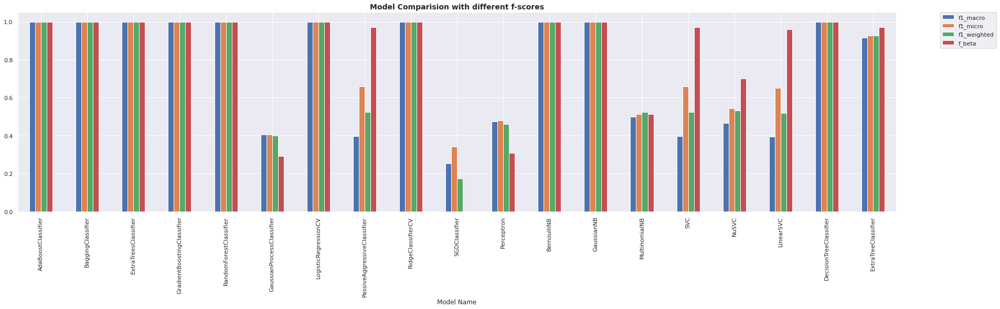

In [99]:
Red_OverSampling.plot(x="Model Name",y=["f1_macro","f1_micro","f1_weighted","f_beta"],kind="bar",figsize=(30, 7))
plt.xticks(rotation=90)
plt.title('Model Comparision with different f-scores',fontsize=14, fontweight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

#### Log Loss Chart

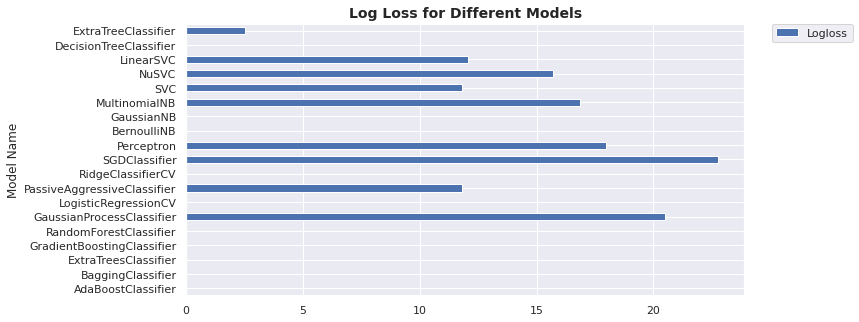

In [100]:
Red_OverSampling.plot(x="Model Name",y=["Logloss"],kind="barh",figsize=(10, 5))
plt.xticks(rotation=360)
plt.title('Log Loss for Different Models',fontsize=14, fontweight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

####  Learning Curve, Scalability and Performance Plots

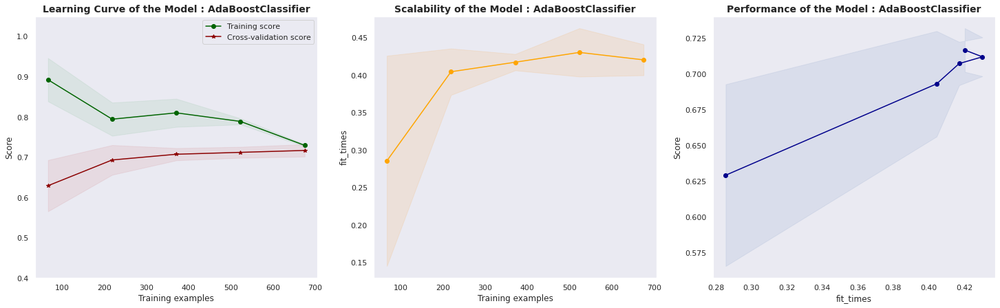

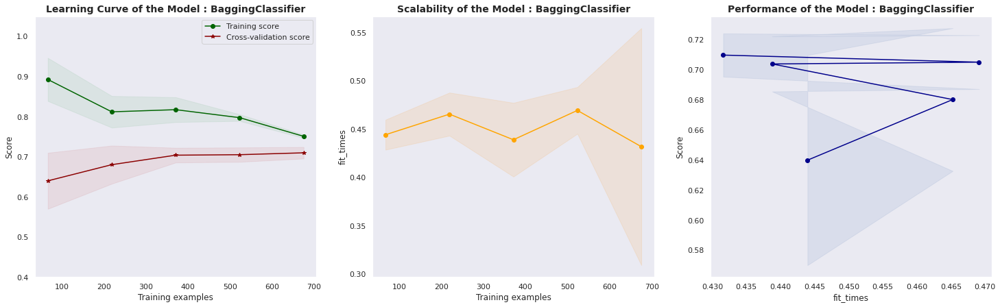

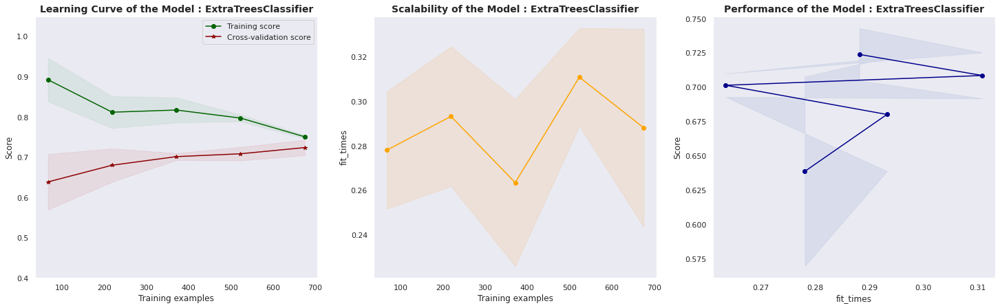

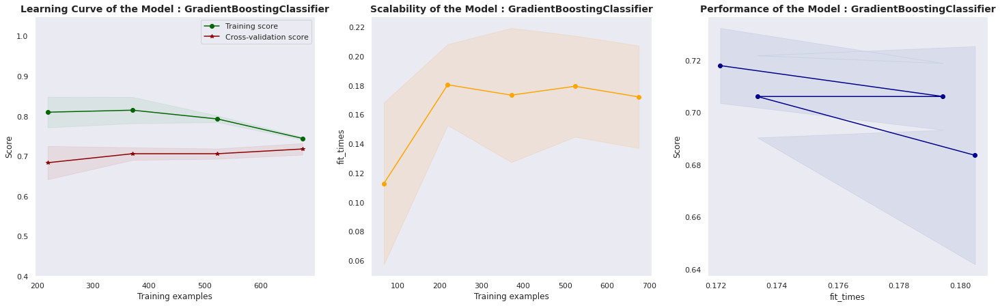

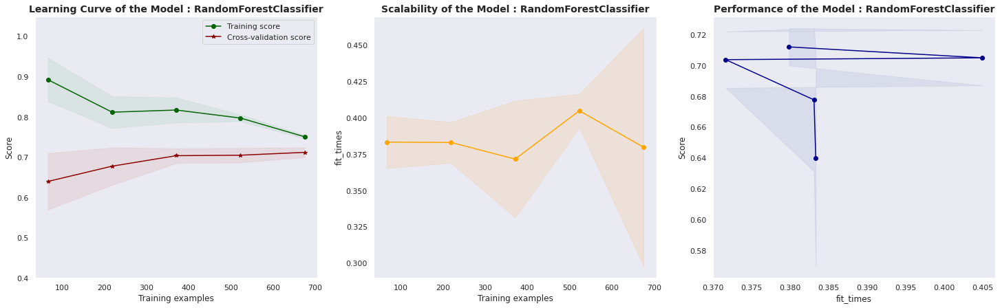

...

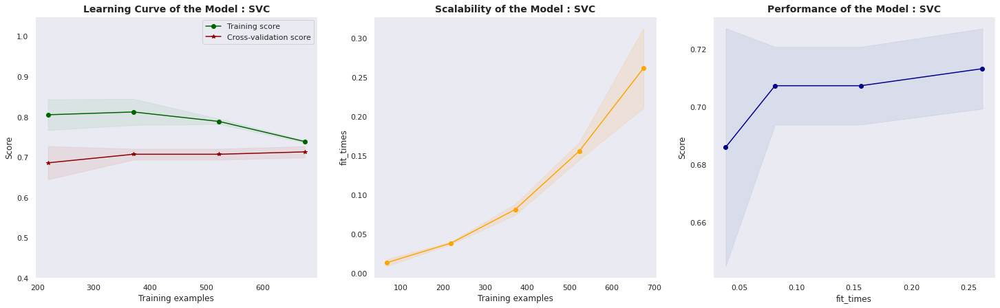

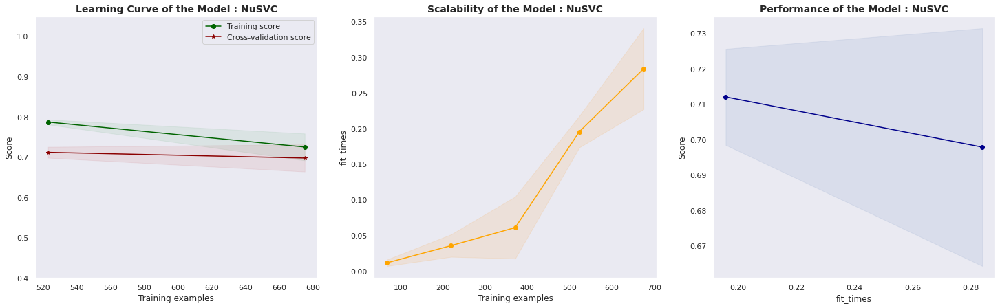

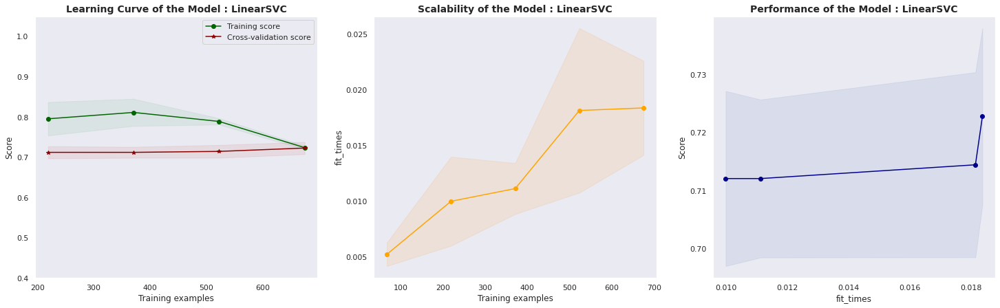

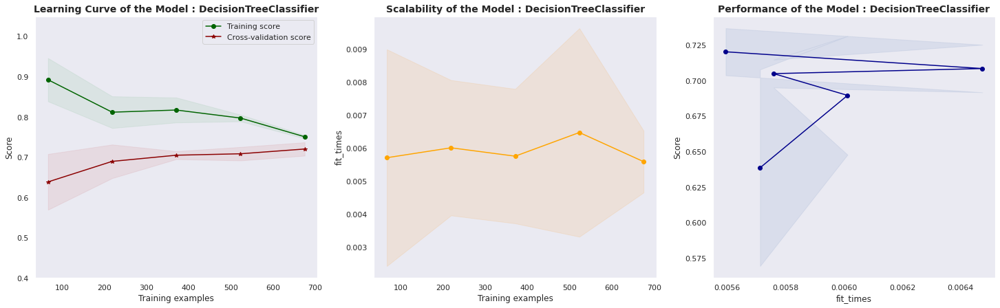

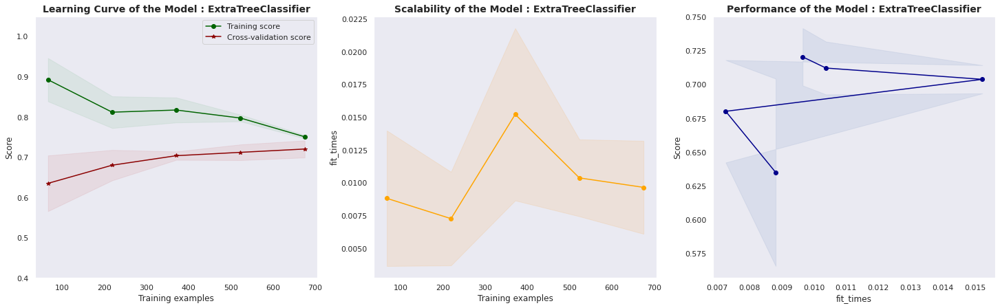

In [101]:
plotperfcurves(x_smote_red,y_smote_red)

#### ROC Comparision Curve

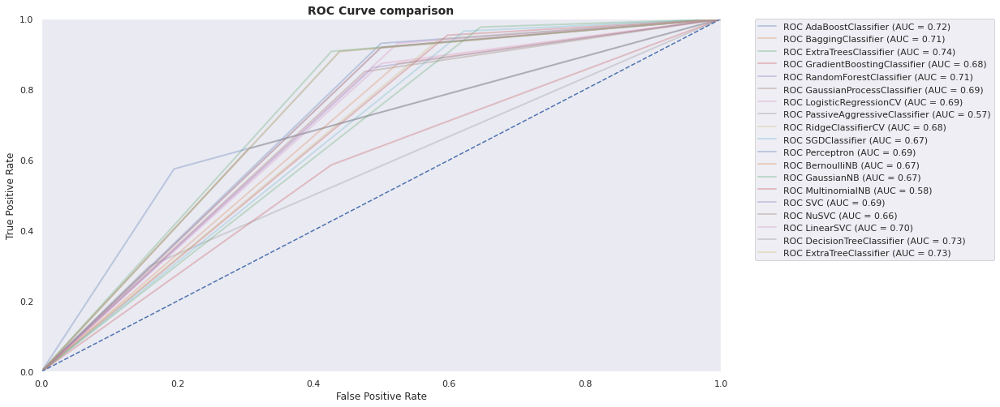

In [102]:
PlotRocCurve(X_train_red_os,y_train_red_os,X_test_red_os,y_test_red_os)

### **Output 5** - Reduced Features - Using Feature Selection


In [103]:
Features = [ 'Married', 'ApplicantIncome', 'LoanAmount','Credit_History','Education_Not Graduate','Property_Area_Rural', 'Property_Area_Semiurban']
X_train_fs= X_train[Features]
y_train_fs= y_train
X_test_fs = X_test[Features]
y_test_fs =y_test

In [104]:
train_enc.Loan_Status.value_counts()

1    422
0    192
Name: Loan_Status, dtype: int64

In [105]:
y_fs = y
X_fs = X[Features]
X_train_red_fs, X_test_red_fs, y_train_red_fs, y_test_red_fs = train_test_split(X_fs, y_fs, test_size=0.20)

#### Learning Curve, Scalability and Performance Plots

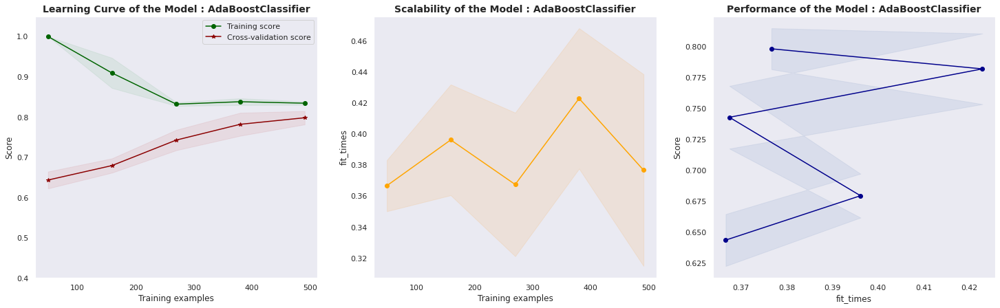

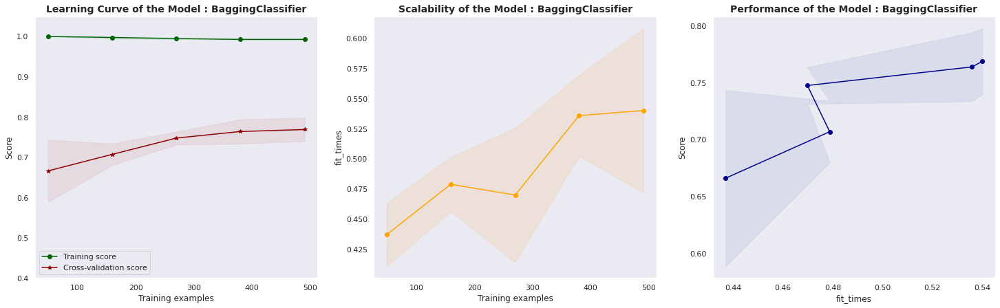

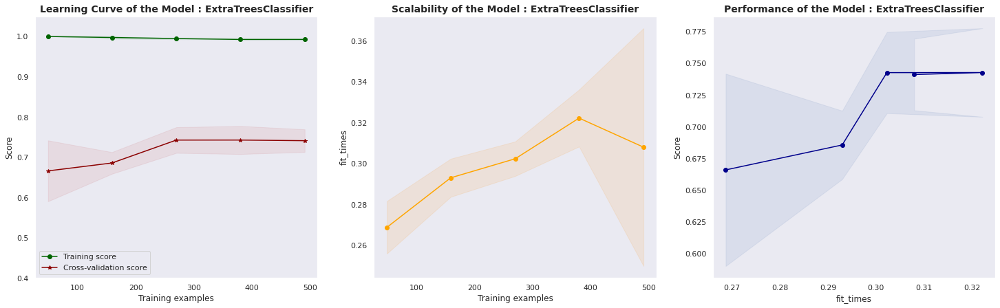

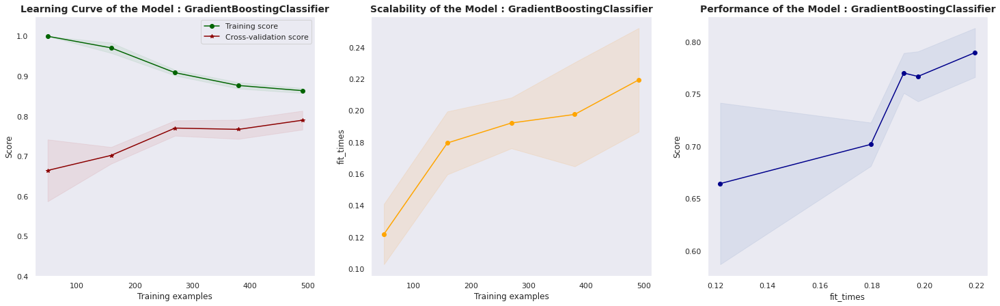

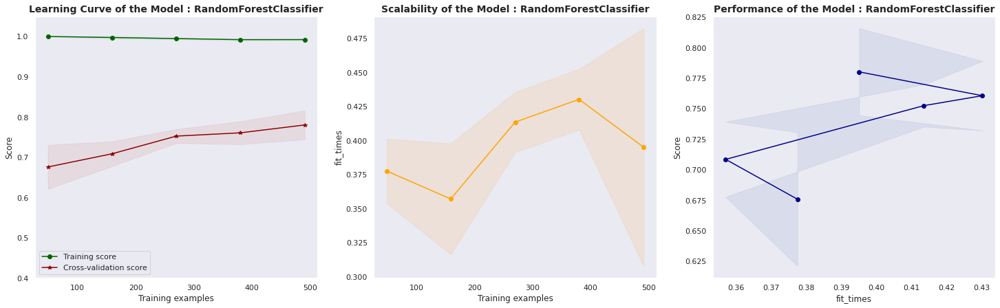

...

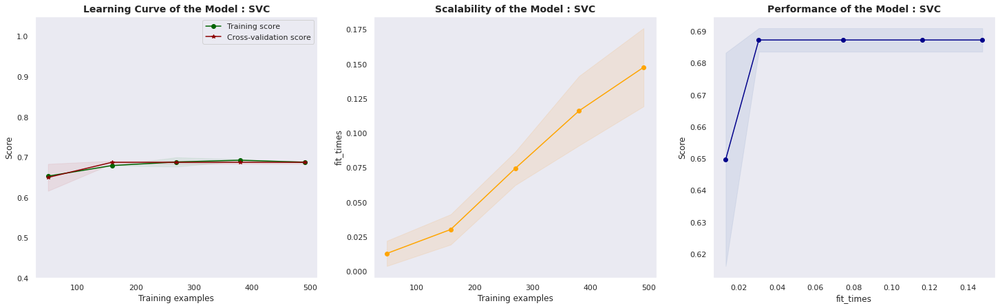

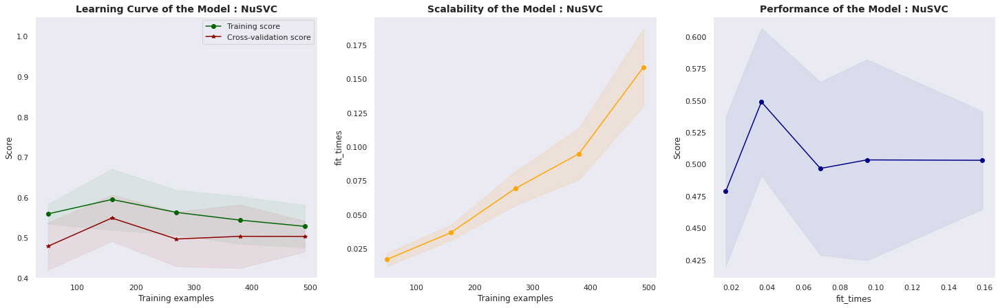

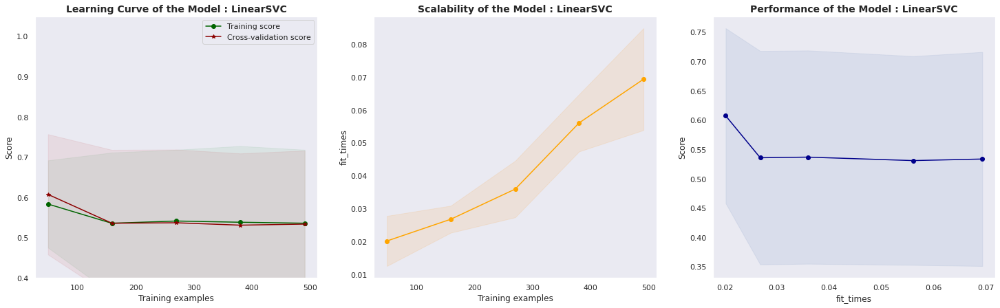

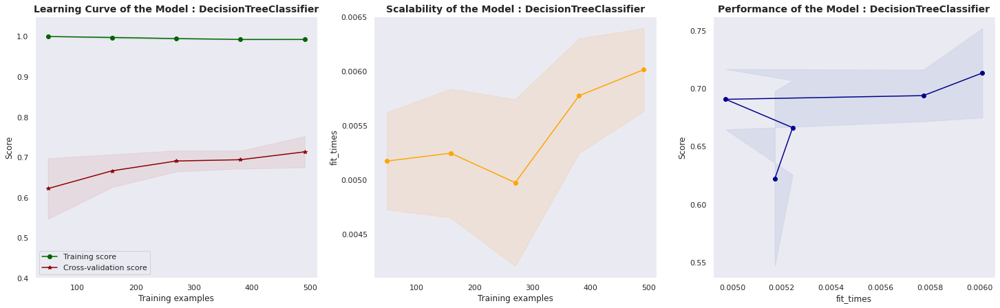

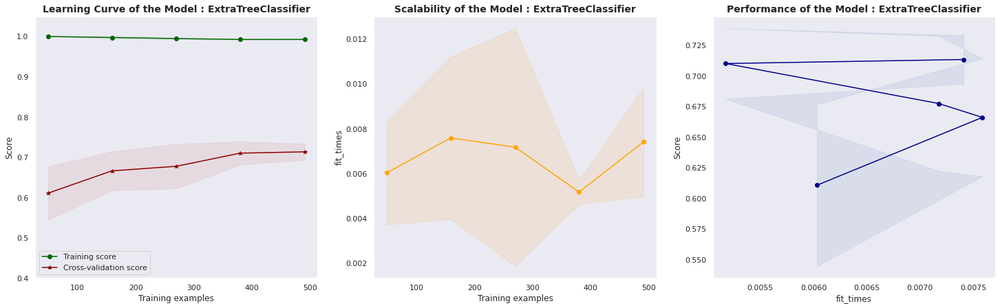

In [106]:
plotperfcurves(X_fs,y_fs)

#### ROC Comparision Curve

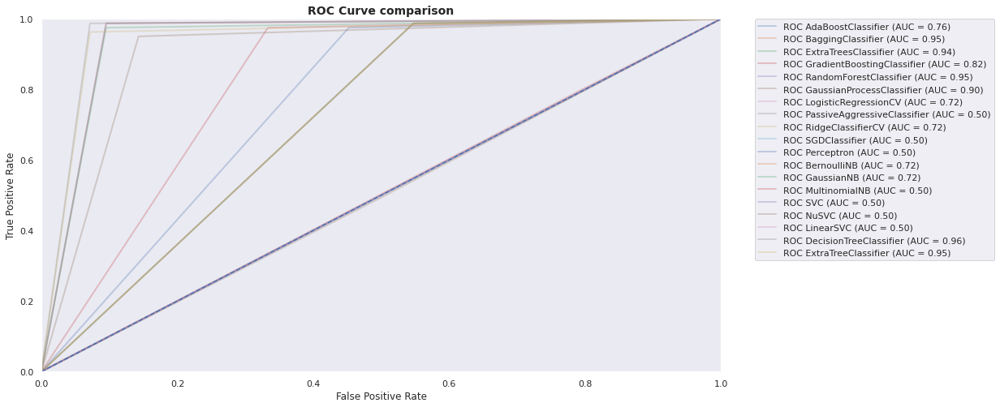

In [107]:
PlotRocCurve(X_train_red_fs,y_train_red_fs,X_test_fs,y_test_fs)

#### Classification Report

In [108]:
Reduced_Fs = Models(X_train_red_fs,y_train_fs,X_test_fs,y_test_fs)
Reduced_Fs

,Model Name,Train Accuracy,Test Accuracy,Precision,Recall,AUC,f1_macro,f1_micro,f1_weighted,f_beta,Logloss,Brier Score Loss
0,AdaBoostClassifier,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
1,BaggingClassifier,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
2,ExtraTreesClassifier,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
3,GradientBoostingClassifier,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
4,RandomForestClassifier,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
5,GaussianProcessClassifier,1.0000,0.4065,0.6053,0.2840,0.463404,0.4059,0.4065,0.3997,0.2931,20.4987,0.5935
6,LogisticRegressionCV,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
7,PassiveAggressiveClassifier,0.6945,0.6585,0.6585,1.0000,0.500000,0.3971,0.6585,0.5230,0.9704,11.7940,0.3415
8,RidgeClassifierCV,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
9,SGDClassifier,0.6965,0.6504,0.6557,0.9877,0.493827,0.3941,0.6504,0.5190,0.9591,12.0748,0.3496


#### F Score Bar Chart

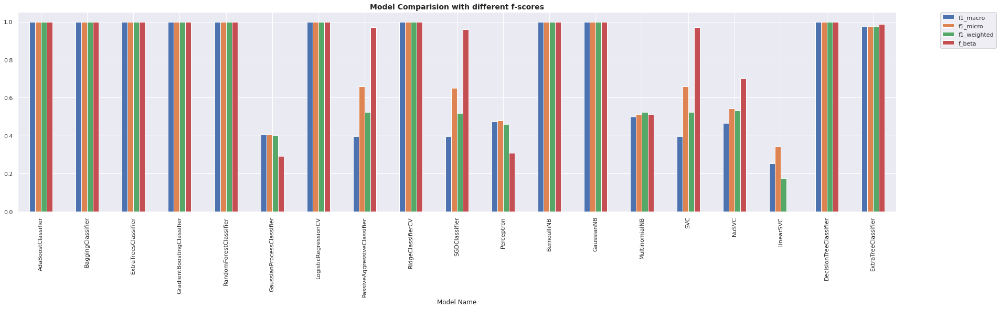

In [109]:
Reduced_Fs.plot(x="Model Name",y=["f1_macro","f1_micro","f1_weighted","f_beta"],kind="bar",figsize=(30, 7))
plt.xticks(rotation=90)
plt.title('Model Comparision with different f-scores',fontsize=14, fontweight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

#### Log Loss Chart

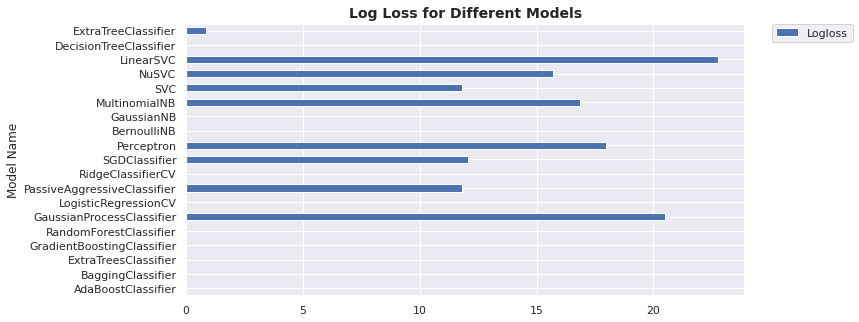

In [110]:
Reduced_Fs.plot(x="Model Name",y=["Logloss"],kind="barh",figsize=(10, 5))
plt.xticks(rotation=360)
plt.title('Log Loss for Different Models',fontsize=14, fontweight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

### **Output 6** - Reduced Features using Feature Selection with Oversampling

In [111]:
from imblearn.over_sampling import SMOTE
smote = SMOTE()
# fit predictor and target variable
x_smote_red_fs, y_smote_red_fs = smote.fit_resample(X_fs, y_fs)
X_train_red_fs_os, X_test_red_fs_os, y_train_red_fs_os, y_test_red_fs_os = train_test_split(x_smote_red_fs, y_smote_red_fs, test_size=0.20)

#### Classification Model Report

In [112]:
Red_fs_OverSampling = Models(X_train_red_fs_os,y_train_red_fs_os,X_test_red_fs_os,y_test_red_fs_os)
Red_fs_OverSampling

,Model Name,Train Accuracy,Test Accuracy,Precision,Recall,AUC,f1_macro,f1_micro,f1_weighted,f_beta,Logloss,Brier Score Loss
0,AdaBoostClassifier,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
1,BaggingClassifier,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
2,ExtraTreesClassifier,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
3,GradientBoostingClassifier,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
4,RandomForestClassifier,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
5,GaussianProcessClassifier,1.0000,0.4065,0.6053,0.2840,0.463404,0.4059,0.4065,0.3997,0.2931,20.4987,0.5935
6,LogisticRegressionCV,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
7,PassiveAggressiveClassifier,0.6945,0.6585,0.6585,1.0000,0.500000,0.3971,0.6585,0.5230,0.9704,11.7940,0.3415
8,RidgeClassifierCV,1.0000,1.0000,1.0000,1.0000,1.000000,1.0000,1.0000,1.0000,1.0000,0.0000,0.0000
9,SGDClassifier,0.6945,0.6585,0.6585,1.0000,0.500000,0.3971,0.6585,0.5230,0.9704,11.7940,0.3415


#### F Score Bar Charts

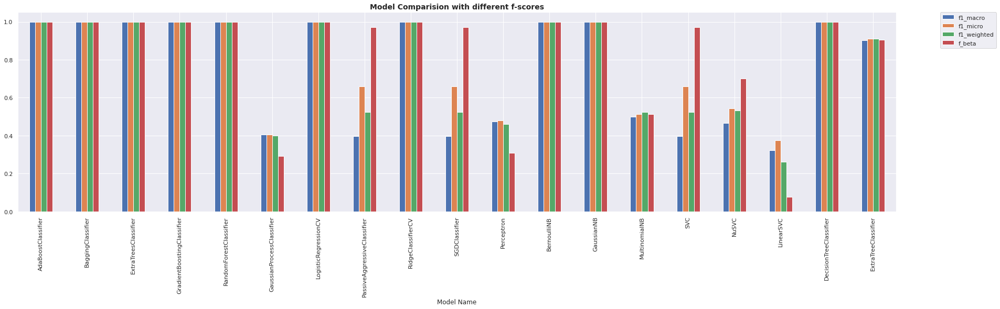

In [113]:
Red_fs_OverSampling.plot(x="Model Name",y=["f1_macro","f1_micro","f1_weighted","f_beta"],kind="bar",figsize=(30, 7))
plt.xticks(rotation=90)
plt.title('Model Comparision with different f-scores',fontsize=14, fontweight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

#### Log Loss Chart

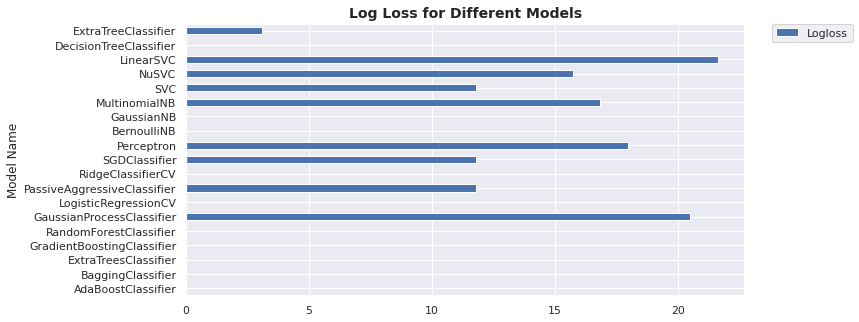

In [114]:
Red_fs_OverSampling.plot(x="Model Name",y=["Logloss"],kind="barh",figsize=(10, 5))
plt.xticks(rotation=360)
plt.title('Log Loss for Different Models',fontsize=14, fontweight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

####  Learning Curve, Scalability and Performance Plots

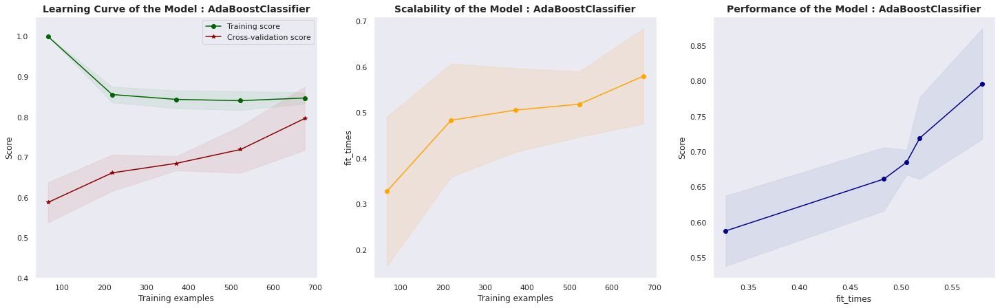

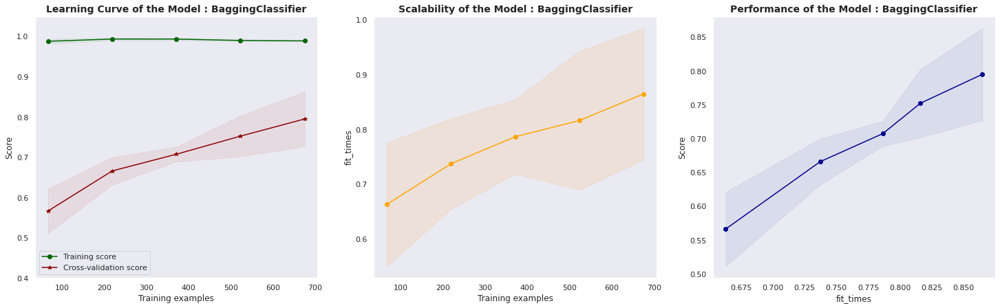

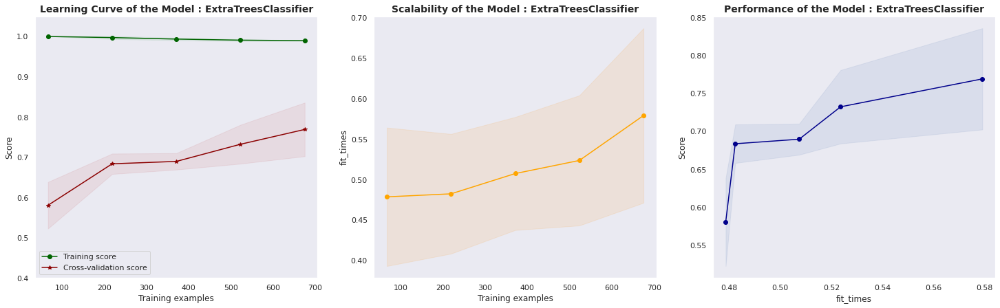

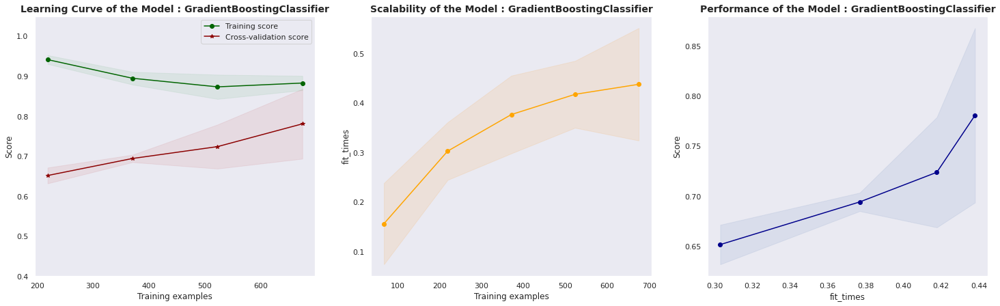

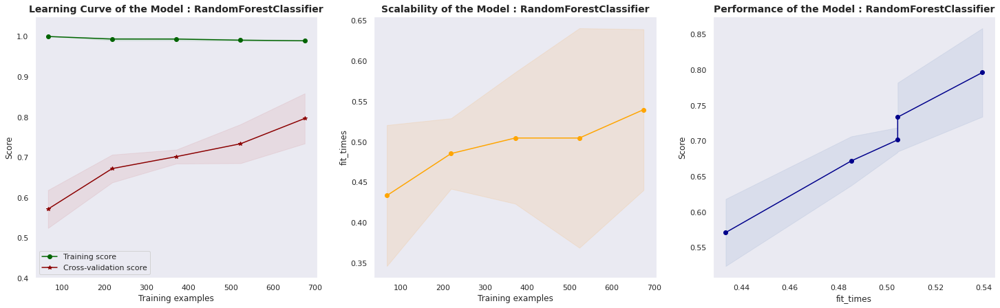

...

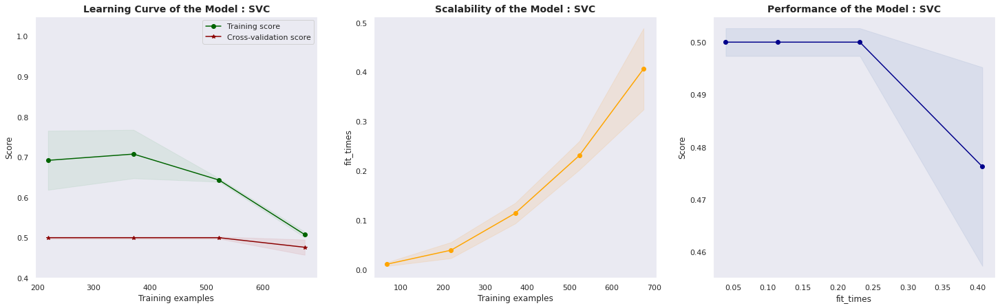

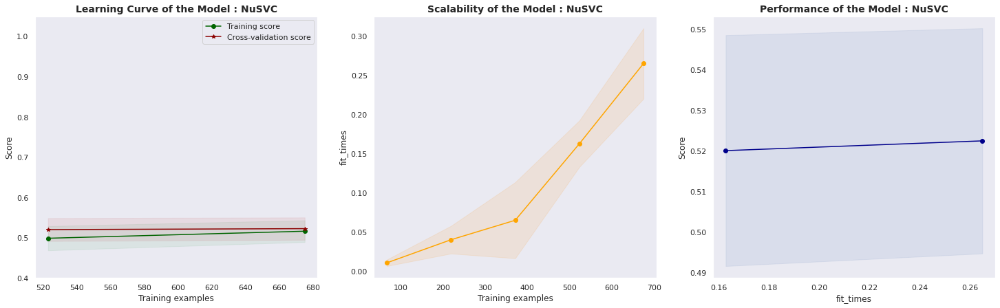

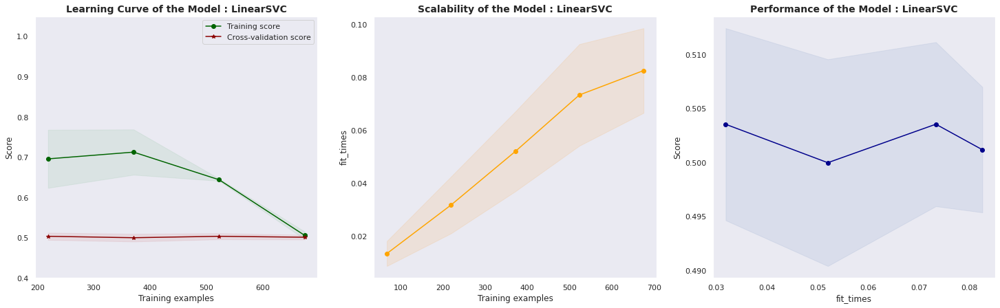

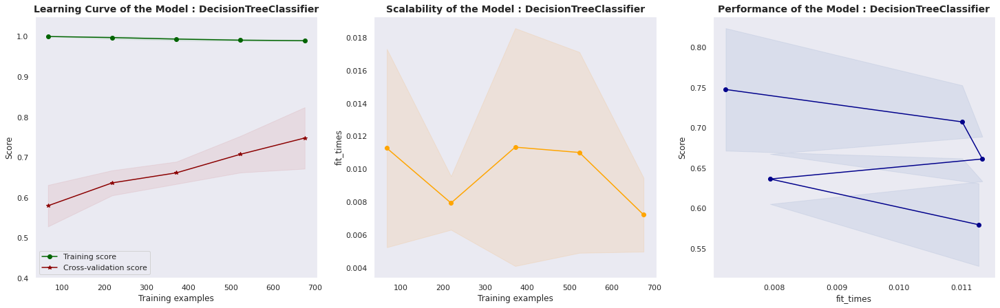

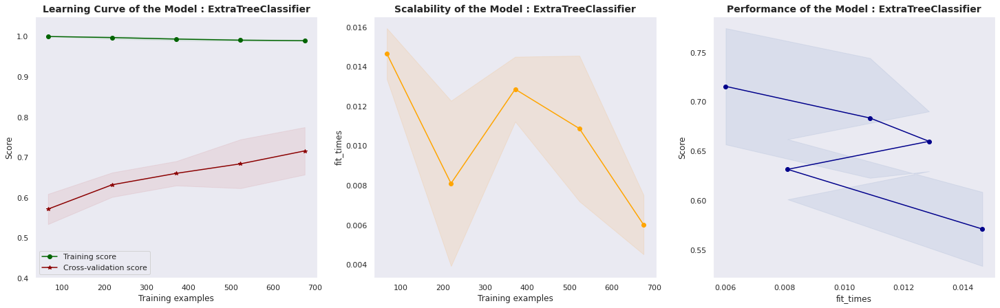

In [115]:
plotperfcurves(x_smote_red_fs,y_smote_red_fs)

#### ROC Comparision Curve

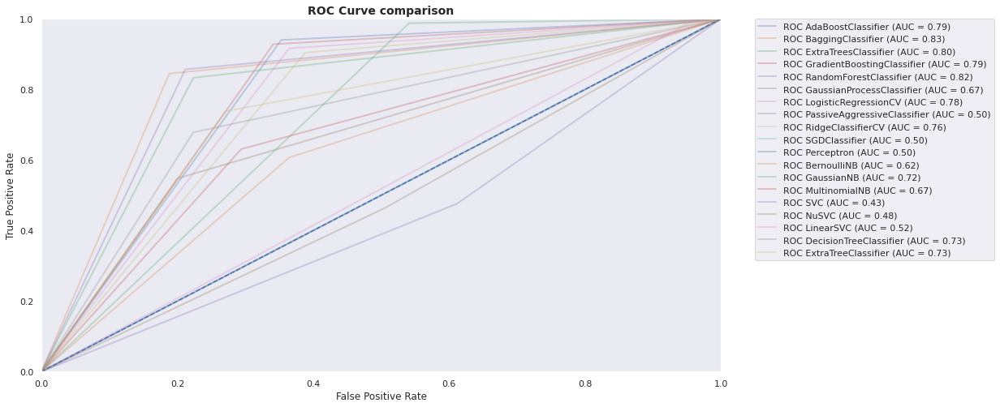

In [116]:
PlotRocCurve(X_train_red_fs_os,y_train_red_fs_os,X_test_red_fs_os,y_test_red_fs_os)